# Setup

In [1]:
import pandas as pd
import numpy as np
import scipy
import nltk

import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.pyplot import figure
from wordcloud import WordCloud

import os
import re
import random
import math
import time
import string
import pickle
import itertools
from typing import *
from dataclasses import dataclass
from collections import defaultdict, Counter

In [2]:
# For reproducibility
SEED = 10
random.seed(SEED)
np.random.seed(SEED)

nltk.download('stopwords')
nltk.download('wordnet')
nltk.download('punkt')
nltk.download('omw-1.4')

# Display the entire text
pd.set_option("display.max_colwidth", None)

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package omw-1.4 to /root/nltk_data...


The dataset is the [Amazon Books Reviews](https://www.kaggle.com/datasets/mohamedbakhet/amazon-books-reviews). If you want to get the dataset directly from Kaggle, you can follow the subsequent cells and unzip it here.

In [ ]:
from google.colab import files
uploaded = files.upload()

Saving kaggle.json to kaggle.json


In [ ]:
os.environ['KAGGLE_CONFIG_DIR'] = "/content"

In [ ]:
!kaggle datasets download -d mohamedbakhet/amazon-books-reviews

In [ ]:
!chmod 600 /content/kaggle.json

In [ ]:
from zipfile import ZipFile

# Create a ZipFile Object and load sample.zip in it
with ZipFile('amazon-books-reviews.zip', 'r') as zipObj:
   # Extract all the contents of zip file in current directory
   zipObj.extractall()

In [ ]:
!ls

amazon-books-reviews.zip  Books_rating.csv  sample_data
books_data.csv		  kaggle.json


In [ ]:
dataset_path = "./Books_rating.csv" # path from Zip extraction
dataset_path = "./datasets/Books_rating.csv" # my local path

df = pd.read_csv(dataset_path, sep = ',') 

# 1. Pre-processing

In [ ]:
df.shape

(3000000, 10)

In [ ]:
df.sample(5)

,Id,Title,Price,User_id,profileName,review/helpfulness,review/score,review/time,review/summary,review/text
2592586,B000K1NC2W,Sign Language Made Simple,NaN,NaN,NaN,5/5,5.0,906768000,Makes learning on your own easy!,"This book has been in my personal library for 10 years. Rather than learning words independently, signing is learned in sentence form. This greatly aids in the retention of the signs. You can begin conversing from lesson one. Easy to follow directions and graphics show how to make the signs. Fingerspelling practice drills are given at the end of each lesson. This book will put you on your way to being a proficient signer."
1947404,B0007GYWQU,"The kings depart;: The tragedy of Germany: Versailles and the German revolution,",NaN,A2BWVOK94IJZPY,"Douglas R. Wieringa ""dwieringa""",0/0,5.0,1272153600,history as it should be written,"After reading and enjoying Dare Call It Treason, Watt's excellent history of the French mutinies in World War I, I put this book on my list, and liked it even more. The Kings Depart is a broad ranging, fascinating, well-written, highly readable account of an important period in history that I knew little about, despite having read a lot about the first and second world wars. What more would you want in a history book?If you want to understand how the first world war led to the second, consider this book required reading.Watt's Bitter Glory: Poland & Its Fate 1918-1939 is next on my list."
1352524,188736871X,"As Timeless As Infinity: The Complete Twilight Zone Scripts of Rod Serling, Volume One",NaN,A13TY93X7EQV8O,Stephen Schlich,5/7,5.0,1094515200,Serling's Legacy in Good Hands,"Rod Serling rode the leading edge of culture in his era. His work still resonates today, forty-five years after the debut of his masterwork. That masterwork has been on the air continuously ever since.Serling's passionate commitment to equality and justice--and especially his willingness to fight The Powers of the Day for these beliefs--anticipated the social turmoil and progress of the Sixties. His use of fantasy to illustrate relevant points about the real world, transformed drama.That's one hell of a legacy to document, but ""As Timeless as Infinity: The Twilight Zone Scripts of Rod Serling"" is up to the task. Its finest touch may be presenting the master's work in its original hand-typed and pencil-edited form. The script pages are as blurry and old-fashioned looking as the black-and-white episodes of Twilight Zone. And Serling's brilliance shines through this time-frozen fog as clearly on the page as it does on the screen.The scripts are the core of this book, but they have elegant support: touching tributes, heart-felt appreciations, and sublime treats such as original clippings of ads and reviews and telegrams and contracts. And of course production photos. There is something for everyone in this volume, the first of a projected ten. These additional pages lend an unusual authenticity to the book; they frame the time that surrounded yet could not restrain The Twilight Zone.Perhaps the finest aspect of this book that is external to Serling's work is the editor's commentary which follows each script. Tony Albarella is a lifelong fan and affianado of The Twilight Zone. He offers the same thoughtful analysis that he gave to Earl Hamner's Twilight Zone scripts in an earlier book, and so much more. You are treated to production notes, snippets from interviews, historical background, philosophical comment.I found myself entranced by the tale of how the projectionst for ""Where is Everybody?"" got so wrapped up in the story that he left CBS President William Paley sitting in the dark between reel 2 and reel 3 of the audition screening. And my mouth dropped open at the real-life twist regarding Cliff Robertson's brush with death before production of ""The Dummy.""You want the details? Buy the book. There's a treasure on every page."
1978140,1847022251,Jane Eyre (Large Print),34.9,A1SMFD252FTJP9,Jerika,4/5,5.0,11180160

## Missing Values

Check if there are missing reviews and if it is the case, remove those rows from the dataset.

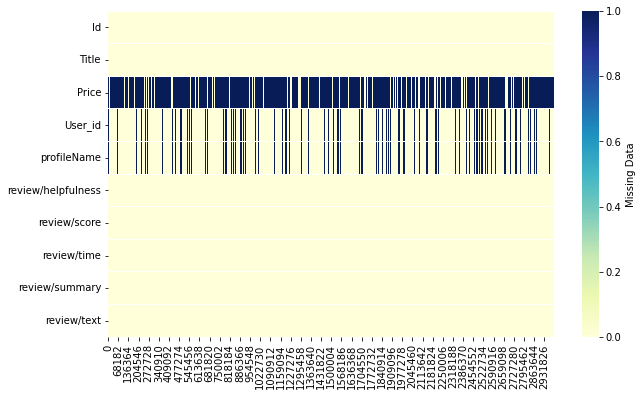

In [ ]:
plt.figure(figsize=(10,6))
sns.heatmap(df.isna().transpose(),
            cmap="YlGnBu",
            cbar_kws={'label': 'Missing Data'})

It seems that there are not missing values for the reviews, but it is better to check manually.

In [ ]:
any(df['review/text'].isnull())

True

Indeed, there are missing values.

In [ ]:
df[df['review/text'].isnull()]

,Id,Title,Price,User_id,profileName,review/helpfulness,review/score,review/time,review/summary,review/text
469860,B000GQK706,The Lord of the Rings - Boxed Set,NaN,NaN,NaN,0/1,5.0,938563200,have only one word to say read ths book,NaN
1139849,B000I1VJLA,The Lord of the Rings Box Set,NaN,NaN,NaN,0/1,5.0,938563200,have only one word to say read ths book,NaN
1368032,B000J1OR0Y,The Lord of the Rings (3 Volume Set),NaN,NaN,NaN,0/1,5.0,938563200,have only one word to say read ths book,NaN
1598329,B000PIIMPW,"The Lord of the Rings Trilogy (The Fellowship of the Ring, The Two Towers, The Return of the King, I, II, III)",NaN,NaN,NaN,0/1,5.0,938563200,have only one word to say read ths book,NaN
1771566,1562802372,The Drive,NaN,A32VJTCIVOG88D,Fire,1/1,5.0,1136678400,Beautiful and Honest - read it 4 times so far,NaN
1923523,B000BI4160,The Lord of the Rings Trilogy: Three Volumes in Slipcase,NaN,NaN,NaN,0/1,5.0,938563200,have only one word to say read ths book,NaN
2584461,B000H7EO2G,The Lord of the Rings Trilogy 3 Volumes,NaN,NaN,NaN,0/1,5.0,938563200,have only one word to say read ths book,NaN
2895564,B000FAIRN2,"The Lord Of The Rings THREE VOLUME BOXED SET (The Fellowship Of The Ring, The Return of The King, The Two towers)",NaN,NaN,NaN,0/1,5.0,938563200,have only one word to say read ths book,NaN


In [ ]:
df.dropna(subset=['review/text'], inplace=True) # Drop NaN

Keep track of the indices in the original dataframe by having a map from the new indices to the old ones.

In [ ]:
map_idx_new_to_old_1 = dict(df.reset_index()['index'])

In [ ]:
df.reset_index(drop=True, inplace=True)

From now on I will only consider the text of the reviews.

In [ ]:
df_text = df['review/text']

In [ ]:
df_text.shape

(2999992,)

In [ ]:
df_text.tail()

2999995                                               This is an extremely difficult book to digest, and it is not for casual readers. However, Collingwood's ideas on a meeting of minds between past and present is absolutely fascinating and gets to the true rewards of historical study.The one problem with this book is Collingwood's assumption that everyone can read and understand Greek. He frequently spices up his argument with a pithy Greek word or phrase, but he assumes that everyone can read Greek and never provides a translation. Footnote translations of the Greek words would be immensely helpful.
2999996    This is pretty interesting. Collingwood seems like on of the first historians to really utilize ideas from evolutionary theory and modern psychology in his overall method. He manages to create a view of history that is centered on the individual attempting to inhabit and understand the mental states of the past, and while I have some major issues with that, the way he structure

## Duplicates

In [ ]:
any(df_text.duplicated())

True

In [ ]:
sum(df_text.duplicated())

937344

I use `values_counts` to count the occurrence of a particular review. Therefore, the following operation will return a Series with the text and its frequency. If the frequency is greater than 1, we have found a duplicate review.

In [ ]:
reviews_frequency = df_text.value_counts()

In [ ]:
reviews_frequency[:5]

digital books are perfect and easy to use! They take up no space on the bookshelf and are always with you!!!                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                            

In [ ]:
reviews_frequency.values[:20]

array([322, 286, 267, 231, 209, 189, 171, 170, 160, 126, 119, 114, 108,
       104, 103, 103,  90,  90,  88,  84])

As we can see, there are a lot of duplicates.

In [ ]:
duplicate_reviews_frequency = reviews_frequency[reviews_frequency >= 2].reset_index()
duplicate_reviews_frequency.rename(columns={"index": "duplicate_review", "review/text": "frequency"}, inplace=True)

In [ ]:
duplicate_reviews_frequency.sample(10)

,duplicate_review,frequency
208811,"Being a trainer and an academic co-ordinator, I find that Vygostky is an essential reader for all trainers / teachers. He helps you understand how to teach better, how to use peer learning and when used with experiential learning gives the best results.",2
328877,I bought this book as a gift for my sister and I ended up reading it before I gave it to her. All I can say is that it was the most fun I have ever had reading a book in my entire life.,2
347254,"Michael Harrison does a phenomenal job with this book. Harrison portrays what it is like to be kidnapped. Martin (the main character) has been kidnapped and the kidnapper seems to believe Martins father has won the lottery. The kidnapper tells Martin everything will be okay if he does everything he is told to do. Martin must deal with several facts throughout the story. He first has to deal with being kidnapped, then he is faced with his father winning the lottery and not telling him, he then is faced with dealing with the fact that the kidnapper has some relation to his own mother. Martin remains frightened throughout the entire book. With the help of Hannah, Martin will be okay. Hannah and Martin work together as a team to escape from the kidnapper. This is truly a remarkable book. The author does a marvelous job portraying Martins fears, but also illustrating how Martin overcame his fear. We suggest this book to everyone. It is appropriate for ages 9 and up to read. It is not a hard read and one can learn so much from this book. We gave this book four stars!!!",2
101100,"chancellorsville is right here outside my windows, and the rappahannock just past the pine grove. when i walk over to the fields that crane sets you in, the ground resonates with the shadowy movements of his scenes. his incredible sense of time &amp; place lives a century or so later. what other books can do the same? red badge defines a moment and it defines us. what more can anyone ask?",4
316489,"******SPOILERS, but nothing unexpected for a Heyer romance***********There is something peculiarly satisfying about this book, in which Heyer puts her usual hero types into the background and brings her usual comic-relief Tulip to the foreground as an unexpected hero.Kind-hearted man-about-town Freddie, who agrees to fake an engagement to his cousin Kitty (previously inaccurated rendered by me as Kate) so that she can enjoy a month in London (and make the man she really loves jealous), is like Bertie Wooster transported to the Regency era. Or, at least, everyone who knows him thinks he's Woosterish, including his sardonic father and the dashing object of Kitty's affections. Both of these men are the sorts of characters Heyer more usually casts as her heroes, and it is in the subverting of the expectations of the genre that Heyer has her triumph in ""Cotillion."" Freddie isn't stupid. It's just that he never has much of anything to think about, so he doesn't. Think, that is. But when he has a problem to solve, he has the knowledge of his social world and the people in it to figure things out. And he is surprisingly hard to bully.One of the pleasures of ""Cotillion"" is that we see exactly why Freddie begins to take his engagement to Kitty seriously, and we see exactly why she comes to appreciate him. He not only has address; he is steadfast. Papageno gets his Papagena, and the cotillion of love confirms the Shakespearian dictum that man is a giddy thing. Indeed, Heyer leads her pairs of lovers through the dance with an almost Shakespearian grace.I will add that my favorite secondary character is Freddie's father, the most suavely sinister and hilariously unflappable parent since Justin, the Duke of Avon. I sometimes do a mental casting of Heyer's books as movies, and Freddie's father is definitely a Christopher Plummer role.",2
152580,"Rather than denigrate religion, it helps to define mankind's potential given his human condition, and should be mandatory in high school and co

In [ ]:
duplicate_reviews_frequency[duplicate_reviews_frequency['duplicate_review'].str.len() < 200].sample(10) # Reviews with less than 200 characters

,duplicate_review,frequency
323472,"Longfellow's Hiawatha, enjoyed by generations, now in the hands of our granddaughter. A soothing rhythm to the words, it is good for reading out loud.",2
127850,Jackie is the only novelist i read. She is the best at her craft and i hope she continues to thrill us all with her writing!!!!!!!,3
265206,This is a remarkable story of the Polish Underground written in 1944 before the end of World War 2. The heroisme shown by the writer is truly amazing.,2
122420,Catcher stands up to the tests of time. I recently re-read it with my fiancee. We enjoyed Holden's travails.,3
270113,"Probally the only Stephen King book I could read over , and over again . I found the transformation of Arnie Cunningham to be scarier then the car. A great book.",2
342141,I have enjoyed reading each of the Bolitho Novels. I am glad to see I have several more to read.,2
83068,"McBain created his normal murder mystery with his good understanding of criminal investigation, office politics and personnel interactions. As usual he creates a neat mystery with surprise ending.",4
227456,This is my altime favorite book! I recommend this book to everone,2
337707,I liked this book because it is a cool adventure. It is also my favorite book because it has a lot of action in it.,2
51720,"Book was ok, nothing special. The only issue I had was with the vendor. Book was late to arrive and with postage due.",6


In [ ]:
duplicate_reviews_frequency.shape

(377349,)

In [ ]:
df[df_text == "digital books are perfect and easy to use! They take up no space on the bookshelf and are always with you!!!"]

,Id,Title,Price,User_id,profileName,review/helpfulness,review/score,review/time,review/summary,review/text
1867,B000N6DDJQ,The Scarlet Letter A Romance,NaN,A3NI29U4P5NQF1,michaelle,0/0,5.0,1357603200,thank you,digital books are perfect and easy to use! They take up no space on the bookshelf and are always with you!!!
13176,1557429227,How to Write and Speak Correctly,11.66,A3NI29U4P5NQF1,michaelle,0/2,5.0,1357603200,thanks,digital books are perfect and easy to use! They take up no space on the bookshelf and are always with you!!!
23946,B000PHIIM0,Leaves of Grass,NaN,A3NI29U4P5NQF1,michaelle,0/0,5.0,1357603200,thank you,digital books are perfect and easy to use! They take up no space on the bookshelf and are always with you!!!
31521,B000E6JMXQ,Twenty Thousand Leagues Under the Sea (Caxton Edition),NaN,A3NI29U4P5NQF1,michaelle,0/0,5.0,1357603200,thank you,digital books are perfect and easy to use! They take up no space on the bookshelf and are always with you!!!
41081,B000PGC9SU,"Autobiography Of Benjamin Franklin, The",NaN,A3NI29U4P5NQF1,michaelle,0/0,5.0,1357603200,thank you,digital books are perfect and easy to use! They take up no space on the bookshelf and are always with you!!!
...,...,...,...,...,...,...,...,...,...,...
2901540,B000PRSHE4,Crime and Punishment,NaN,A3NI29U4P5NQF1,michaelle,0/0,5.0,1357603200,Thank you,digital books are perfect and easy to use! They take up no space on the bookshelf and are always with you!!!
2913578,B000O41WNG,Black Beauty: His Grooms and Companions. Second Frank Miller Edition.,NaN,A3NI29U4P5NQF1,michaelle,0/0,5.0,1357603200,thank you,digital books are perfect and easy to use! They take up no space on the bookshelf and are always with you!!!
2933041,B0006DGQWC,The sayings of Confucius,NaN,A3NI29U4P5NQF1,michaelle,0/0,5.0,1357603200,thanks,digital books are perfect and easy to use! They take up no space on the bookshelf and are always with you!!!
2957300,B000NW46MI,Little Men,NaN,A3NI29U4P5NQF1,michaelle,0/0,5.0,1357603200,thank you,digital books are perfect and easy to use! They take up no space on the bookshelf and are always with you!!!


In [ ]:
df[df_text == "Building up my library so no time to read-then-review but looks good at first glance. Sorry I can't be of more help but it will be a while before I do. The title caught my eye!"]

,Id,Title,Price,User_id,profileName,review/helpfulness,review/score,review/time,review/summary,review/text
3237,1574900072,The Night Horseman (Sagebrush Largeprint Westerns),NaN,A1MZB6UBKOVSK0,K. E. Hawes,0/0,3.0,1355961600,Building up my library so no time to read-then-review but looks good at first glance. Sorry I can't be of more help but it will,Building up my library so no time to read-then-review but looks good at first glance. Sorry I can't be of more help but it will be a while before I do. The title caught my eye!
23489,B00072KEN4,The American frugal housewife: Dedicated to those who are not ashamed of economy,NaN,A1MZB6UBKOVSK0,K. E. Hawes,0/3,3.0,1355961600,Building up my library so no time to read-then-review but looks good at first glance. Sorry I can't be of more help but it will,Building up my library so no time to read-then-review but looks good at first glance. Sorry I can't be of more help but it will be a while before I do. The title caught my eye!
26817,B000NSJFPU,The Gardener,NaN,A1MZB6UBKOVSK0,K. E. Hawes,0/0,3.0,1355961600,Building up my library so no time to read-then-review but looks good at first glance. Sorry I can't be of more help but it will,Building up my library so no time to read-then-review but looks good at first glance. Sorry I can't be of more help but it will be a while before I do. The title caught my eye!
28189,B0007J0QWQ,A sentimental journey through France and Italy,NaN,A1MZB6UBKOVSK0,K. E. Hawes,0/0,3.0,1355961600,Building up my library so no time to read-then-review but looks good at first glance. Sorry I can't be of more help but it will,Building up my library so no time to read-then-review but looks good at first glance. Sorry I can't be of more help but it will be a while before I do. The title caught my eye!
31928,B0008CPJEW,A child's book of saints,NaN,A1MZB6UBKOVSK0,K. E. Hawes,0/4,3.0,1355961600,Building up my library so no time to read-then-review but looks good at first glance. Sorry I can't be of more help but it will,Building up my library so no time to read-then-review but looks good at first glance. Sorry I can't be of more help but it will be a while before I do. The title caught my eye!
...,...,...,...,...,...,...,...,...,...,...
2953372,B000N6QN6G,The Great Astronomers.,NaN,A1MZB6UBKOVSK0,K. E. Hawes,0/0,3.0,1355961600,Building up my library so no time to read-then-review but looks good at first glance. Sorry I can't be of more help but it will,Building up my library so no time to read-then-review but looks good at first glance. Sorry I can't be of more help but it will be a while before I do. The title caught my eye!
2956416,0786110155,Greenmantle,49.95,A1MZB6UBKOVSK0,K. E. Hawes,0/2,3.0,1355961600,Building up my library so no time to read-then-review but looks good at first glance. Sorry I can't be of more help but it will,Building up my library so no time to read-then-review but looks good at first glance. Sorry I can't be of more help but it will be a while before I do. The title caught my eye!
2988761,0904724719,Alice in Wonderland (Tell tales),NaN,A1MZB6UBKOVSK0,K. E. Hawes,0/1,3.0,1355961600,Building up my library so no time to read-then-review but looks good at first glance. Sorry I can't be of more help but it will,Building up my library so no time to read-then-review but looks good at first glance. Sorry I can't be of more help but it will be a while before I do. The title caught my eye!
2991084,B0007DS2ZU,"Caesar and Cleopatra,",NaN,A1MZB6UBKOVSK0,K. E. Hawes,0/0,3.0,1355961600,Building up my library so no time to read-then-review but looks good at first glance. Sorry I can't be of more help but it will,Building up my library so no time to read-then-review but looks good at first glance. Sorry I can't be of more help but it will be a while before I do. The title caught my eye!


In [ ]:
df[df_text=="I'm trying to get started in games and have bought many books to help me out, but this one is by far my favorite. Once I got it, I could jump right to chapters that answered many of the questions I had been wondering about. I like sports games and so all of the stuff on building fast games was useful to me. I think anybody getting going in games will want to use this book alot."]

,Id,Title,Price,User_id,profileName,review/helpfulness,review/score,review/time,review/summary,review/text
2999705,0072228997,Ultimate Game Design: Building Game Worlds,25.2,A116KNTRQNNNYW,Sherry Martin,0/6,5.0,1053734400,Perfect for anyone with a big interest in games,"I'm trying to get started in games and have bought many books to help me out, but this one is by far my favorite. Once I got it, I could jump right to chapters that answered many of the questions I had been wondering about. I like sports games and so all of the stuff on building fast games was useful to me. I think anybody getting going in games will want to use this book alot."
2999709,0072228997,Ultimate Game Design: Building Game Worlds,25.2,A116KNTRQNNNYW,Sherry Martin,2/8,5.0,1053820800,Perfect for anyone with a big interest in games,"I'm trying to get started in games and have bought many books to help me out, but this one is by far my favorite. Once I got it, I could jump right to chapters that answered many of the questions I had been wondering about. I like sports games and so all of the stuff on building fast games was useful to me. I think anybody getting going in games will want to use this book alot."


I noticed that some people reviewed different books with the same comment. In this case I decided to remove all the duplicate reviews, because, since they are equal, they cannot help in finding topics. Moreover, by carefully analyzing the duplicate reviews I noticed that some of them are quite useless, as they do not talk about the book, but about their experience, e.g.:
> digital books are perfect and easy to use! They take up no space on the bookshelf and are always with you!!!

> Building up my library so no time to read-then-review but looks good at first glance. Sorry I can't be of more help but it will be a while before I do. The title caught my eye!

Even though these reviews seem useless, I decided to keep them (there could be a cluster of "experience reviews").

In general, I will remove all duplicates and keeping only one occurence of them. Of course this will change the TF-IDF of the documents, but I prefer to have less reviews, as in the end I am interesting in clusters of topics.

In [ ]:
print(f"Number of duplicates: {sum(df_text.duplicated())}") # Overall we have almost one million reviews that are duplicate

Number of duplicates: 937344


In [ ]:
print(f"Number of reviews before: {df_text.shape[0]}")

Number of reviews before: 2999992


In [ ]:
df_text.drop_duplicates(inplace=True) # This keeps the first duplicate occurence

In [ ]:
map_idx_new_to_old_2 = dict(df_text.reset_index()['index'])

In [ ]:
df_text.reset_index(drop=True, inplace=True)

In [ ]:
print(f"Number of reviews after: {df_text.shape[0]}")

Number of reviews after: 2062648


As we can see I have reduced the dataset a lot, since there were about 1 milion duplicate reviews.

Now I can procede with the text cleaning process.

## Text Cleaning

In [ ]:
contractions_dict = {
  "ain't": "am not",
  "aren't": "are not",
  "can't": "cannot",
  "can't've": "cannot have",
  "'cause": "because",
  "could've": "could have",
  "couldn't": "could not",
  "couldn't've": "could not have",
  "didn't": "did not",
  "doesn't": "does not",
  "don't": "do not",
  "hadn't": "had not",
  "hadn't've": "had not have",
  "hasn't": "has not",
  "haven't": "have not",
  "he'd": "he would",
  "he'd've": "he would have",
  "he'll": "he will",
  "he'll've": "he will have",
  "he's": "he is",
  "how'd": "how did",
  "how'd'y": "how do you",
  "how'll": "how will",
  "how's": "how is",
  "i'd": "I would",
  "i'd've": "I would have",
  "i'll": "I will",
  "i'll've": "I will have",
  "i'm": "I am",
  "i've": "I have",
  "isn't": "is not",
  "it'd": "it had",
  "it'd've": "it would have",
  "it'll": "it will",
  "it'll've": "it will have",
  "it's": "it is",
  "let's": "let us",
  "ma'am": "madam",
  "mayn't": "may not",
  "might've": "might have",
  "mightn't": "might not",
  "mightn't've": "might not have",
  "must've": "must have",
  "mustn't": "must not",
  "mustn't've": "must not have",
  "needn't": "need not",
  "needn't've": "need not have",
  "o'clock": "of the clock",
  "oughtn't": "ought not",
  "oughtn't've": "ought not have",
  "shan't": "shall not",
  "sha'n't": "shall not",
  "shan't've": "shall not have",
  "she'd": "she would",
  "she'd've": "she would have",
  "she'll": "she will",
  "she'll've": "she will have",
  "she's": "she is",
  "should've": "should have",
  "shouldn't": "should not",
  "shouldn't've": "should not have",
  "so've": "so have",
  "so's": "so is",
  "that'd": "that would",
  "that'd've": "that would have",
  "that's": "that is",
  "there'd": "there had",
  "there'd've": "there would have",
  "there's": "there is",
  "they'd": "they would",
  "they'd've": "they would have",
  "they'll": "they will",
  "they'll've": "they will have",
  "they're": "they are",
  "they've": "they have",
  "to've": "to have",
  "wasn't": "was not",
  "we'd": "we had",
  "we'd've": "we would have",
  "we'll": "we will",
  "we'll've": "we will have",
  "we're": "we are",
  "we've": "we have",
  "weren't": "were not",
  "what'll": "what will",
  "what'll've": "what will have",
  "what're": "what are",
  "what's": "what is",
  "what've": "what have",
  "when's": "when is",
  "when've": "when have",
  "where'd": "where did",
  "where's": "where is",
  "where've": "where have",
  "who'll": "who will",
  "who'll've": "who will have",
  "who's": "who is",
  "who've": "who have",
  "why's": "why is",
  "why've": "why have",
  "will've": "will have",
  "won't": "will not",
  "won't've": "will not have",
  "would've": "would have",
  "wouldn't": "would not",
  "wouldn't've": "would not have",
  "y'all": "you all",
  "y'alls": "you alls",
  "y'all'd": "you all would",
  "y'all'd've": "you all would have",
  "y'all're": "you all are",
  "y'all've": "you all have",
  "you'd": "you had",
  "you'd've": "you would have",
  "you'll": "you will",
  "you'll've": "you will have",
  "you're": "you are",
  "you've": "you have"
}

In [ ]:
from nltk.stem.porter import PorterStemmer
from nltk.stem import WordNetLemmatizer

nltk_stopwords = nltk.corpus.stopwords.words('english')

from sklearn.feature_extraction.text import ENGLISH_STOP_WORDS
sklearn_stopwords = ENGLISH_STOP_WORDS

from gensim.parsing.preprocessing import remove_stopwords
import gensim
gensim_stopwords = gensim.parsing.preprocessing.STOPWORDS

import spacy
sp = spacy.load('en_core_web_sm')
spacy_stopwords = sp.Defaults.stop_words


class TextCleaner:
    def __init__(self, df_text: pd.DataFrame, contractions_dict: Optional[ Dict[str, str] ] = None):
        self.df_text = df_text

        # Contractions
        self.contractions_dict = contractions_dict

        # URL pattern
        self.url_pattern = re.compile("http[s]?://(?:[a-zA-Z]|[0-9]|[$-_@.&+]|[!*\(\),]|(?:%[0-9a-fA-F][0-9a-fA-F]))+")
        self.htlm_pattern = re.compile('<.*?>|&([a-z0-9]+|#[0-9]{1,6}|#x[0-9a-f]{1,6});')

        # Emoji pattern
        self.emoji_pattern = re.compile("["
                                u"\U0001F600-\U0001F64F"  # emoticons
                                u"\U0001F300-\U0001F5FF"  # symbols & pictographs
                                u"\U0001F680-\U0001F6FF"  # transport & map symbols
                                u"\U0001F1E0-\U0001F1FF"  # flags (iOS)
                                u"\U00002702-\U000027B0"
                                u"\U000024C2-\U0001F251"
                                "]+", flags=re.UNICODE)

        # Punctuation
                                    # The last two dashes seem the same but actually they are not.
        self.punctuation = set(string.punctuation) | set(["‘","’", "“", "”", "–", "―", "—"])

        # Stopwords
        # self.stop_words = set(nltk.corpus.stopwords.words('english')) 
        self.stop_words = set(nltk_stopwords) | set(sklearn_stopwords) | \
                          set(gensim_stopwords) | set(spacy_stopwords)
        

    def clean_df(self, remove_emoji: bool = True, do_lemmatization: bool = False, do_stemming: bool = False):
        df_text_clean = self.df_text.apply(self.clean_text, args=(remove_emoji, do_lemmatization, do_stemming,) )    
        return df_text_clean

    def clean_text (
        self,
        text: str, 
        remove_emoji: bool = True,
        do_lemmatization: bool = False,
        do_stemming: bool = False,
    ) -> str:

        """
        Returns
        -------
            A 'cleaned' string, where are removed HTML, URLS, emoji, 
            punctuation, stopword and numbers. It can also be
            lemmatized or stemmed.
            
        Parameters
        ----------
        text: str
            The string to be cleaned. In this case, a sentence from the dataset.

        remove_emoji: bool,
            If True emoji are removed.
        
        do_lemmatization: bool
            If True the text is also lemmatize.
        
        do_stemming: bool
            If True the text is also stemmatize.    
        """

        text = str(text).lower()
        
        # Remove HTML
        text = self.htlm_pattern.sub(r'', text)
        text = self.url_pattern.sub(r'', text)
        
        # Remove Emoji
        if remove_emoji:
            text = self.emoji_pattern.sub(r'', text)
        
        # Remove contractions
        if contractions_dict is not None:
            text = ' '.join([contractions_dict[token] if token in self.contractions_dict else token for token in text.split()])
        
        # Remove punctuation
        text = ''.join([punc if punc not in self.punctuation else " " for punc in text])
        
        # Remove stopwords
        text = ' '.join([word for word in text.split() if word not in self.stop_words])

        # Remove numbers
        text = re.sub("\d+", "", text)

        # Lemming
        if do_lemmatization:
            lemmatizer = WordNetLemmatizer()
            text_lemmatize = [lemmatizer.lemmatize(token) for token in text.split()]
            text = ' '.join(text_lemmatize)

        # Stemming: e.g., history --> histori, historical --> histori
        if do_stemming:
            stemmer = PorterStemmer() 
            text_stemmed = [stemmer.stem(token) for token in text.split()]
            text = ' '.join(text_stemmed)

        # Remove strings with one or two characters only
        text = ' '.join([l for l in text.split() if len(l) >= 3])

        return text.strip() # Remove all the useless space

/usr/local/lib/python3.8/dist-packages/torch/cuda/__init__.py:497: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")


In [ ]:
text_cleaner = TextCleaner(df_text, contractions_dict)

Check for emoji

In [ ]:
emoij = []
for idx, text in enumerate(df_text):
    if text_cleaner.emoji_pattern.match(str(text)):
        emoij.append((idx, text[:10]))
len(emoij)

0

`remove_emoji` is false because there are no emoji in the dataset.

In [ ]:
df_text_cleaned = text_cleaner.clean_df(remove_emoji=False, do_lemmatization=True)

In [ ]:
df_text_cleaned = text_cleaner.clean_df(remove_emoji=False, do_stemming=True)

I cleaned up the dataset by applying both lemmatization and stemming. I will do clustering with both the datasets. The advantage of **stemming** is that it reduced the TF-IDF vector dimensionality, as many words with the same root are grouped together. So, it avoids repetitions of 'ing', 'ed' and 's' forms that are present a lot in the dataset.

In [ ]:
df_text_cleaned.shape

(2062648,)

I decided to save the cleaned dataset to disk, to avoid the cleaning operation to be executed every time.

You can directly import the dataset from the next cell.

    df_text_cleaned.to_csv(path_or_buf="./datasets/cleaned_text_lemmatization.csv", index=False)

    df_text_cleaned.to_csv(path_or_buf="./datasets/cleaned_text_stemming.csv", index=False)

In [ ]:
df_text_cleaned = pd.read_csv("./datasets/cleaned_text_lemmatization.csv", sep = ',')['review/text']

In [ ]:
df_text_cleaned = pd.read_csv("./datasets/cleaned_text_stemming.csv", sep = ',')['review/text']

I check if after the pre-processing some reviews got completely delete because with a lot of noise.

In [ ]:
df_text_cleaned[df_text_cleaned.isnull()].shape # Operation that works if you load the dataset from the previous cell

(80,)

In [ ]:
# df_text_cleaned[df_text_cleaned == ""].shape # Otherwise you should check for empty strings

I remove these reviews.

In [ ]:
df_text_cleaned.dropna(inplace=True) # Drop NaN

In [ ]:
map_idx_new_to_old_3 = dict(df_text_cleaned.reset_index()['index'])

In [ ]:
df_text_cleaned.reset_index(drop=True, inplace=True)

In [ ]:
df_text_cleaned.shape 

(2062568,)

Save on disk all the relevant data structure.

    with open('./datasets/map_1_stemming', 'wb') as f:
        pickle.dump(map_idx_new_to_old_1, f, protocol=pickle.HIGHEST_PROTOCOL)

In [ ]:
with open('./datasets/map_1_stemming', 'rb') as f:
    map_idx_new_to_old_1 = pickle.load(f)

    with open('./datasets/map_2_stemming', 'wb') as f:
        pickle.dump(map_idx_new_to_old_2, f, protocol=pickle.HIGHEST_PROTOCOL)

In [ ]:
with open('./datasets/map_2_stemming', 'rb') as f:
    map_idx_new_to_old_2 = pickle.load(f)

    with open('./datasets/map_3_stemming', 'wb') as f:
        pickle.dump(map_idx_new_to_old_3, f, protocol=pickle.HIGHEST_PROTOCOL)

In [ ]:
with open('./datasets/map_3_stemming', 'rb') as f:
    map_idx_new_to_old_3 = pickle.load(f)

After all the pre-processing, we are still able to get the original info from the dataset, as we can map the new indices to the original ones.

In [ ]:
map_idx_new_to_origin = {idx: map_idx_new_to_old_1[map_idx_new_to_old_2[map_idx_new_to_old_3[idx]]] for idx in df_text_cleaned.index}

    with open('./datasets/map_origin_stemming.pkl', 'wb') as f:
        pickle.dump(map_idx_new_to_origin, f, protocol=pickle.HIGHEST_PROTOCOL)

I directly store the final version of the dataset, without NaNs.

    df_text_cleaned.to_csv(path_or_buf="./datasets/cleaned_without_nan_stemming.csv", index=False)

# 2 Text Analysis

In [ ]:
from sklearn.feature_extraction.text import TfidfVectorizer, CountVectorizer
from sklearn.random_projection import SparseRandomProjection as srp
from sklearn.model_selection import train_test_split
from sklearn.decomposition import TruncatedSVD, PCA
from sklearn.cluster import KMeans, MiniBatchKMeans
from sklearn.preprocessing import Normalizer
from sklearn.pipeline import make_pipeline
from sklearn import metrics

In this part, I will investigate the different vocabularies when text was processed through lemmatization and via stemming. Thanks to this analysis I will figure out which are the best hyper-parameters (`min_df`, `max_df`) for the topic analysis.

I will use the subsequent functions and class in the analysis part.

In [ ]:
def print_word_frequency(
        word: str, 
        vocabulary: Dict[str, int], 
        word_frequencies_arr: Union[np.array, List[int]]
    ) -> None:
        if word not in vocabulary:
            print(f"The word `{word}` is not present.")
            return

        word_idx = vocabulary[word]
        print(f"`{word}` has frequency: {word_frequencies_arr[word_idx]}")

In [ ]:
def plot_freq(num_words_to_plot: int, word_frequencies: Dict[str, int], title: str = "Plot"):
    """
    Returns
    -------
        A bar chart with frequency of tokens.
    """

    # The width of the figure is proportional to the number of words to plot
    figure(figsize=((2/5) * num_words_to_plot, 4), dpi=80)

    words = []
    frequencies = []

    for idx, (word, freq) in enumerate(word_frequencies.items()):
        if idx == num_words_to_plot - 1:
            break
            
        words.append(word)
        frequencies.append(freq)

    plt.bar(range(len(frequencies)), frequencies, tick_label=words)
    plt.xticks(rotation=45)
    plt.ylabel('Frequency', fontsize=12)
    plt.title(title, fontsize=12)
    plt.show()

In [ ]:
@dataclass
class Vocabulary_Analysis:
    """
    Class to load vocabulary info from path files.
    If 'count_vectorizer' and 'words_count' are None,
    then they will be recovered from disk.
    """
    def __init__(self, file_name_type: str, count_vectorizer=None, words_count=None):
        
        self.count_vectorizer = count_vectorizer
        self.words_count = words_count

        # Load from file
        if file_name_type is not None:
            count_vectorizer_path = f"./datasets/count_vectorizer_{file_name_type}.pkl" 

            # Try to retrieve count vectorizer
            try:
                with open(count_vectorizer_path, 'rb') as f:
                    self.count_vectorizer = pickle.load(f)
                    print("Get count vectorizer from file...")
            except OSError:
                print(f"Could not open/read file: {count_vectorizer_path}")
                return

            words_count_path = f"./datasets/words_count_{file_name_type}.npz"

            # Try to retrieve words count
            try:
                self.words_count = scipy.sparse.load_npz(words_count_path)
                print("Get words count from file...")
            except OSError:
                print(f"Could not open/read file: {words_count_path}")
                return

        # Words in the vocabulary
        self.words = self.count_vectorizer.get_feature_names_out()

        # Maps words to indices
        self.vocabulary = self.count_vectorizer.vocabulary_

        # Maps indices to words
        self.reversed_vocabulary = {v: k for k, v in self.vocabulary.items()}

        # Compute words frequencies by summing up the occurrencies of each word
        self.word_frequencies_arr = np.asarray(self.words_count.sum(axis=0)).squeeze()
        
        # Get the indices of the words frequency sorted in descending order
        self.idx_sorted_by_frequency = np.argsort(self.word_frequencies_arr)

        # Maps words to frequency (sorted by frequency in ascending, descending order)
        self.word_frequencies_ascending, self.word_frequencies_descending = self.get_frequencies_dict()

    def get_frequencies_dict(self):
        word_frequencies = {}
        for idx in range(len(self.word_frequencies_arr)):
            word = self.reversed_vocabulary[idx]
            freq = self.word_frequencies_arr[idx]
            word_frequencies[word] = freq  
            
        # sort in ascending order
        ascending_order = dict(sorted(word_frequencies.items(), key=lambda x: x[1]))
        
        # sort in descending order
        descending_order = dict(sorted(word_frequencies.items(), key=lambda x: x[1], reverse=True))

        return ascending_order, descending_order


## Lemmatization Analysis

In [ ]:
df_text_lemmatization = pd.read_csv("./datasets/cleaned_without_nan_lemmatization.csv", sep = ',')['review/text']

In [ ]:
df_text_lemmatization.shape

(2062570,)

In [ ]:
df_text_lemmatization[df_text_lemmatization.duplicated()].shape # There are still duplicates, but they are few, so I will keep them.

(2467,)

I will use the `CountVectorizer` class to count word occurrencies and then their frequencies.

In [ ]:
count_vectorizer_lemmatization = CountVectorizer(lowercase=False) # Text is already in lowercase

In [ ]:
words_count_lemmatization = count_vectorizer_lemmatization.fit_transform(df_text_lemmatization)

    with open('./datasets/count_vectorizer_lemmatization_all.pkl', 'wb') as f:
        pickle.dump(count_vectorizer_lemmatization, f)

In [ ]:
analysis_lemmatization = Vocabulary_Analysis("lemmatization_all")

/usr/local/lib/python3.8/dist-packages/sklearn/base.py:288: UserWarning: Trying to unpickle estimator CountVectorizer from version 1.0.2 when using version 1.2.0. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(


Get count vectorizer from file...
Get words count from file...


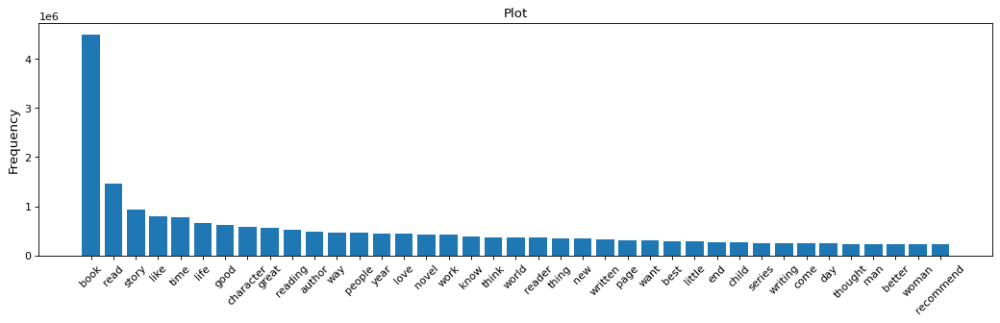

In [ ]:
plot_freq(40, analysis_lemmatization.word_frequencies_descending)

As expected, the most frequent words are 'book', 'read', 'story', etc. Therefore, I can look at their frequency and cut off them when I will compute the TF-IDF vectors, thanks to the `max_df` parameter.

In this part there will be many cells that will simply show terms, frequencies and indices; but I preferred to leave open most of them to show the type of analysis I did.

In [ ]:
analysis_lemmatization.word_frequencies_descending

{'book': 4496770,
 'read': 1455518,
 'story': 930859,
 'like': 792458,
 'time': 776712,
 'life': 657036,
 'good': 618877,
 'character': 584368,
 'great': 571541,
 'reading': 515640,
 'author': 481955,
 'way': 473069,
 'people': 462984,
 'year': 449647,
 'love': 442356,
 'novel': 431713,
 'work': 417695,
 'know': 389562,
 'think': 363100,
 'world': 360532,
 'reader': 358818,
 'thing': 356127,
 'new': 343623,
 'written': 320852,
 'page': 311924,
 'want': 307475,
 'best': 296634,
 'little': 290451,
 'end': 263942,
 'child': 259675,
 'series': 251933,
 'writing': 248644,
 'come': 244985,
 'day': 240919,
 'thought': 235959,
 'man': 235577,
 'better': 235267,
 'woman': 234215,
 'recommend': 234122,
 'history': 232789,
 'lot': 227554,
 'interesting': 221811,
 'old': 214269,
 'family': 213124,
 'need': 211579,
 'point': 208905,
 'chapter': 206946,
 'feel': 198043,
 'war': 196730,
 'make': 195585,
 'real': 193800,
 'friend': 191131,
 'help': 188264,
 'long': 188173,
 'word': 186595,
 'fact': 18

I will remove words with frequency more than 263.000, so all the words after 'end'.

In [ ]:
analysis_lemmatization.words[(analysis_lemmatization.word_frequencies_arr > 50) & (analysis_lemmatization.word_frequencies_arr < 60)][200:400]

array(['aurthur', 'aussi', 'authenticating', 'authorizing',
       'autobiographer', 'autocourse', 'autors', 'availabe', 'avalible',
       'aventura', 'aviary', 'avril', 'awarness', 'ayala', 'ayinde',
       'azlan', 'azores', 'azrael', 'azzarello', 'babson', 'babyhood',
       'bachelard', 'bacillus', 'backhand', 'backhouse', 'backsliding',
       'backswing', 'badajoz', 'badder', 'badwater', 'bagger',
       'baguazhang', 'baigent', 'bailiff', 'baku', 'bal', 'balam',
       'balch', 'baldness', 'balin', 'balkoski', 'balled', 'baltar',
       'bama', 'bambino', 'banach', 'banda', 'banderas', 'bandura',
       'banerjee', 'banfield', 'bangalore', 'bantry', 'bantu', 'banzhaf',
       'barash', 'barbecuing', 'bardamu', 'barebones', 'barnet', 'barset',
       'bartoli', 'baseness', 'bate', 'batterer', 'battlefront',
       'baumgartner', 'bawl', 'bayern', 'bayes', 'bayley', 'bayonne',
       'bazillion', 'bcs', 'beable', 'beached', 'beaders', 'beal',
       'beanpole', 'beany', 'beasley'

Instead, with this *naive* approach I will inspect the vocabulary words and their respective frequency in order to understand what type of words the text is composed of.

In [ ]:
from_ = 1000
to_ = 1050
analysis_lemmatization.words[from_:to_]

array(['abbildungen',
       'abbildungensignaturenbibliographienamensverzeichnisphotonachweis',
       'abbilities', 'abbility', 'abbinaeus', 'abbing', 'abbington',
       'abbis', 'abbisinia', 'abble', 'abbnet', 'abbo', 'abbominations',
       'abbondano', 'abbondio', 'abbondonza', 'abbor', 'abboration',
       'abborrant', 'abbot', 'abbotess', 'abbotsford', 'abbotsport',
       'abbotsville', 'abbott', 'abbottbook', 'abbottcreated',
       'abbottexposes', 'abbotthe', 'abbottnowhere', 'abbottopen',
       'abbotts', 'abbottsville', 'abboud', 'abbout', 'abbr',
       'abbracciarlo', 'abbrasive', 'abbrassive', 'abbre', 'abbrev',
       'abbrevation', 'abbrevations', 'abbreveations', 'abbreviaitons',
       'abbreviate', 'abbreviated', 'abbreviatedand', 'abbreviatedtapes',
       'abbreviateed'], dtype=object)

In [ ]:
analysis_lemmatization.word_frequencies_arr[from_:to_]

array([  2,   1,   2,   5,   2,   6,   2,   1,   1,   4,   1,   4,   1,
         1,   4,   1,   1,   1,   1, 616,   1,   4,   1,   3, 680,   1,
         1,   1,   1,   1,   1,   6,   1,   8,   4,   1,   1,   3,   1,
         1,   1,   3,   3,   1,   1,  41, 667,   1,   1,   1])

For instance, if some words appear strange to me, I will directly look at the original review to see if I made some mistakes at text-cleaning time.  

So, first I will get the review(s) index in the current text dataset.

In [ ]:
to_analyze = set()

word_to_anlayze = "abbildungensignaturenbibliographienamensverzeichnisphotonachweis"

for idx, review in df_text_lemmatization.items():
    for word in review.split():
        if word == word_to_anlayze:
            to_analyze.add(idx)

In [ ]:
to_analyze

{656113}

I will use the dictionary I stored in the pre-processig analysis.

In [ ]:
with open('./datasets/map_origin_lemmatization.pkl', 'rb') as f:
    map_idx_new_to_origin_lemmatization = pickle.load(f)

In [ ]:
i = 656113

In [ ]:
df_text_lemmatization[i]

'german edition grohmann willi baumeister leben und werk predates english language release abrams year mid century book high quality dumont schauberg koln patterned cloth hardback board sewn binding dustjacket card stock slipcase pound like illustration color tipped color plate page genuinely fine good color reproduction time period table contentseinletungjugend und erste anfrange von den mauerbildern zur uberseidlung nach frankfurt main von den frankfurter jahren zum ausbruch krieges wahrend krieges von den metaphysischen landschaftern zum tode rande werkes und schlussworttafelnbiographische datenaustellungenverzeichnis der gruppenwekverzeichnis mit abbildungensignaturenbibliographienamensverzeichnisphotonachweis'

In [ ]:
df['review/text'][map_idx_new_to_origin_lemmatization[i]]

"The German edition of Grohmann's Willi Baumeister: Leben und Werk predates the English language release (Abrams) by 3 years.A mid-century book of high quality by M. DuMont Schauberg out of Koln: patterned cloth over hardback boards with a sewn binding in dustjacket and card stock slipcase. 362 pp, 5 pounds.Something like 700 illustrations in b&w; and color. The tipped-in color plates (all full page) are genuinely fine -- just about as good as color reproductions get for this time period.TABLE OF CONTENTSEinletungJugend und erste Anfrange 1889-1918Von den Mauerbildern bis zur Uberseidlung nach Frankfurt (Main) 1919-1928Von den Frankfurter Jahren bis zum Ausbruch des Krieges 1928-1939Wahrend des Krieges 1939-1945Von den Metaphysischen Landschaftern bis zum Tode 1945-1955An Rande des Werkes und SchlusswortTafelnBiographische DatenAustellungenVerzeichnis der GruppenWekverzeichnis mit AbbildungenSignaturenBibliographieNamensverzeichnisPhotonachweis"

So, the strange word *abbildungensignaturenbibliographienamensverzeichnisphotonachweis* was actually in the original dataset.

In [ ]:
from_ = 410100
to_ = 410150
analysis_lemmatization.words[from_:to_]

array(['knowlegdeable', 'knowlegdebale', 'knowlegdge', 'knowlegdment',
       'knowlege', 'knowlegeabel', 'knowlegeabl', 'knowlegeable',
       'knowlegeble', 'knowleged', 'knowlegedable', 'knowlegede',
       'knowlegement', 'knowleges', 'knowlegible', 'knowler',
       'knowlerdge', 'knowles', 'knowlesadvanceyour',
       'knowlesconcentrated', 'knowlesdge', 'knowlesge', 'knowlesn',
       'knowlesteaching', 'knowlesthis', 'knowleton', 'knowlewdge',
       'knowlge', 'knowlidge', 'knowligotti', 'knowling', 'knowlingly',
       'knowlister', 'knowlledge', 'knowllege', 'knowlodge',
       'knowlodgment', 'knowloedge', 'knowlrdege', 'knowlse', 'knowlson',
       'knowlton', 'knowltons', 'knowltonthe', 'knowlwdge', 'knowlwedge',
       'knowm', 'knowmany', 'knowmartail', 'knowmichael'], dtype=object)

In [ ]:
analysis_lemmatization.word_frequencies_arr[from_:to_]

array([  1,   1, 478,   1,   1,   1,   5,   1,   3,   1,   1,   1,   7,
         1,   1,   1,   1,   3,   5,   1,  15,   2,   1,   1,   1,   7,
        29,   1,   6,   1,  30,   1,   2,   1,   2,   1,  23,   1,   1,
         1,   1,   2,   1, 119,   1,   1,   2,   1,   1,   1])

In [ ]:
analysis_lemmatization.words[from_:to_][analysis_lemmatization.word_frequencies_arr[from_:to_] == 43]

array(['eww'], dtype=object)

261

In [ ]:
to_analyze = set()

word_to_anlayze = "grudem"

for idx, review in df_text_lemmatization.items():
    for word in review.split():
        if word == word_to_anlayze:
            to_analyze.add(idx)

I noticed that there are many words with the same prefix:

> administrative, administrated, administrator, etc.

> sibilance, sibilancy, sibilant, etc.

> knowlegement, knowleges, knowlegible, etc.

Thus, I can consider to do stemming to reduce the vocabulary size, so those similar words will be groupped into a singular token. This can be helpfull because I will not remove those words but simply incrementing the frequency of a token.

For instance, most of the 'administrative' words will be mapped to a single 'administrat' word, that potentially will be mantained in the vocabulary. 

### Reduced Vocabulary Lemmatization

I reduce the lemmatize vocabulary and see which clusters I can get.

I selected the following words to be removed, thanks to the previous analysis and the one about clustering.

In [ ]:
words_to_remove = ["going", "point", "page", "plot", "lot", "novel", "world", "reader", "end", "little", "better", "best", "come", "thought", "easy", "half", "jordan", "bit", "series", "long", "piece", "list", "non", "yes", "tool", "name", "anti", "met", "worse",]

In [ ]:
reduced_count_vectorizer_lemmatization = CountVectorizer(lowercase=False, min_df=50, max_df=263_000, stop_words=words_to_remove)

In [ ]:
reduced_words_count_lemmatization = reduced_count_vectorizer_lemmatization.fit_transform(df_text_lemmatization)

In [ ]:
reduced_words_count_lemmatization.shape

(2062570, 46079)

    with open('./datasets/count_vectorizer_lemmatization_reduced.pkl', 'wb') as f:
        pickle.dump(reduced_count_vectorizer_lemmatization, f)

    scipy.sparse.save_npz('./datasets/words_count_lemmatization_reduced.npz', reduced_words_count_lemmatization)

In [ ]:
analysis_lemmatization_reduced = Vocabulary_Analysis("lemmatization_reduced")

Get count vectorizer from file...
Get words count from file...


In [ ]:
analysis_lemmatization_reduced = Vocabulary_Analysis(file_name_type=None, count_vectorizer=reduced_count_vectorizer_lemmatization, words_count=reduced_words_count_lemmatization)

In [ ]:
len(analysis_lemmatization_reduced.vocabulary)

46079

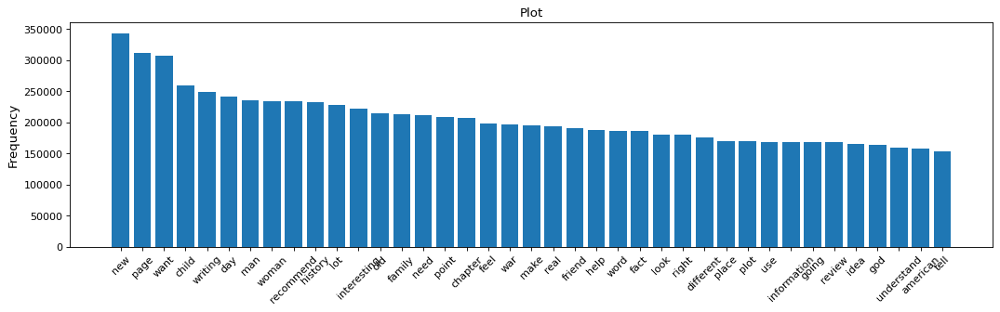

In [ ]:
plot_freq(40, analysis_lemmatization_reduced.word_frequencies_descending)

In [ ]:
analysis_lemmatization_reduced.word_frequencies_ascending['jordan']

19512

## Stemming Analysis

In this part I will replicate the analysis done for the lemmatize text.

In [ ]:
df_text_stemming = pd.read_csv("./datasets/cleaned_without_nan_stemming.csv", sep = ',')['review/text']

In [ ]:
df_text_stemming.shape

(2062568,)

In [ ]:
count_vectorizer_stemming = CountVectorizer(lowercase=False) # Text is already in lowercase

In [ ]:
words_count_stemming = count_vectorizer_lemmatization.fit_transform(df_text_stemming)

    with open('./datasets/count_vectorizer_stemming_all.pkl', 'wb') as f:
        pickle.dump(count_vectorizer_stemming, f)

    scipy.sparse.save_npz('./datasets/words_count_stemming_all.npz', reduced_words_count_stemming)

In [ ]:
analysis_stemming = Vocabulary_Analysis("stemming_all")

Get count vectorizer from file...
Get words count from file...


In [ ]:
analysis_stemming.words_count.shape

(2062568, 685095)

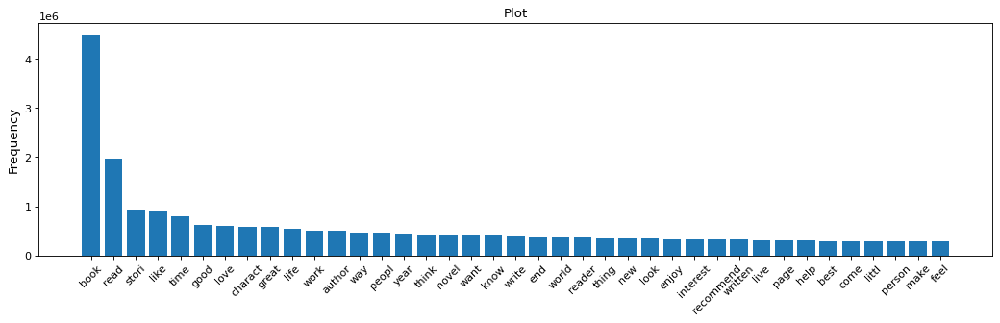

In [ ]:
plot_freq(40, analysis_stemming.word_frequencies_descending)

The distribution is very similar to what we get from the lemmatization part

In [ ]:
analysis_stemming.word_frequencies_descending

{'book': 4497586,
 'read': 1971364,
 'stori': 931329,
 'like': 910309,
 'time': 787648,
 'good': 625428,
 'love': 608883,
 'charact': 584522,
 'great': 577083,
 'life': 550073,
 'work': 504204,
 'author': 501307,
 'way': 473073,
 'peopl': 463835,
 'year': 449660,
 'think': 435182,
 'novel': 433460,
 'want': 416085,
 'know': 416039,
 'write': 392151,
 'end': 376673,
 'world': 360545,
 'reader': 358830,
 'thing': 356144,
 'new': 343870,
 'look': 341932,
 'enjoy': 332524,
 'interest': 324786,
 'recommend': 323319,
 'written': 320859,
 'live': 314297,
 'page': 312594,
 'help': 307725,
 'best': 296829,
 'come': 293968,
 'littl': 290499,
 'person': 288055,
 'make': 284033,
 'feel': 283597,
 'use': 278487,
 'need': 265551,
 'understand': 255522,
 'seri': 252507,
 'thought': 248226,
 'start': 244213,
 'review': 243293,
 'learn': 242402,
 'tri': 241651,
 'day': 240939,
 'man': 237221,
 'wonder': 237067,
 'better': 236015,
 'histori': 232975,
 'differ': 229326,
 'lot': 227554,
 'point': 221860,


In [ ]:
analysis_stemming.word_frequencies_ascending

{'aaaaaaaaaaaaaa': 1,
 'aaaaaaaaaaaaaaaaaa': 1,
 'aaaaaaaaaaaaaaaaaaaaa': 1,
 'aaaaaaaaaaaaaaaaaaaaaa': 1,
 'aaaaaaaaaaaaaaaaaaaaaaaaaaaa': 1,
 'aaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaahhh': 1,
 'aaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaathi': 1,
 'aaaaaaaaaaaaaaaaaaaaah': 1,
 'aaaaaaaaaaaaaaaaaaaaahhhhhhhhhhhhhh': 1,
 'aaaaaaaaaaaaaaaaaaahhh': 1,
 'aaaaaaaaaaaaaaaaahhhhhhh': 1,
 'aaaaaaaaaaaaaahhhhhhh': 1,
 'aaaaaaaaaaaahhhhhhhh': 1,
 'aaaaaaaaaaaarrrrrgh': 1,
 'aaaaaaaaaaaarrrrrrrggggggggghhhhhhhhhhh': 1,
 'aaaaaaaaaaah': 1,
 'aaaaaaaaaaahhhhhhhhhhh': 1,
 'aaaaaaaaaaanywho': 1,
 'aaaaaaaaaaargh': 1,
 'aaaaaaaaaahhhhhhhhhhhhhh': 1,
 'aaaaaaaaaction': 1,
 'aaaaaaaaah': 1,
 'aaaaaaaaahhhhh': 1,
 'aaaaaaaag': 1,
 'aaaaaaaah': 1,
 'aaaaaaaahhhh': 1,
 'aaaaaaahaaaaaaaaaa': 1,
 'aaaaaaahhhhhhh': 1,
 'aaaaaaahhhhhhhhhhhhhhh': 1,
 'aaaaaachooo': 1,
 'aaaaaahhhhhhh': 1,
 'aaaaaahhhhhhhhhh': 1,
 'aaaaaaiiiieeeeeeeeeee': 1,
 'aaaaaalllll': 1,
 'aaaaaani': 1,
 'aaaaagh': 1,
 'aaaaa

In [ ]:
analysis_stemming.words[(analysis_stemming.word_frequencies_arr > 150) & (analysis_stemming.word_frequencies_arr < 180)][-200:]

array(['tertullian', 'tesseract', 'testiment', 'tetralog', 'texto',
       'thad', 'thaddeu', 'thang', 'thatth', 'theauthor', 'theoretician',
       'thermomet', 'thermopoli', 'theta', 'thinketh', 'thisi', 'thori',
       'thougt', 'thr', 'threadbar', 'through', 'thunderbolt', 'tillman',
       'tilney', 'timeshar', 'tirith', 'tiro', 'tish', 'toaster', 'tohru',
       'toledo', 'tong', 'toothbrush', 'topless', 'torina', 'toung',
       'township', 'traditon', 'tradtion', 'trailhead', 'transluc',
       'trata', 'trav', 'traviss', 'treehous', 'trevanian', 'triangular',
       'tribesmen', 'trina', 'tripwir', 'triumphantli', 'troward',
       'tsarmina', 'tull', 'tung', 'turvi', 'twaddl', 'tweedi', 'typhu',
       'udal', 'uglier', 'ummm', 'unabomb', 'unaccustom', 'unasham',
       'unassail', 'unattach', 'unbend', 'unceremoni', 'uncount',
       'uncouth', 'undergird', 'underplay', 'undestand', 'undin',
       'undisturb', 'unearthli', 'unenjoy', 'unequal', 'unevenli',
       'unflapp',

In [ ]:
from_ = 400100
to_ = 400150
analysis_stemming.words[from_:to_]

array(['muneer', 'munenori', 'muner', 'munera', 'munerum', 'munesh',
       'munevar', 'muney', 'muneyoshi', 'munez', 'munfordvil', 'munfort',
       'mung', 'munga', 'mungar', 'munger', 'mungerthegreat', 'mungi',
       'mungin', 'mungl', 'mungo', 'mungojerri', 'mungoshi', 'mungovan',
       'mungret', 'mungri', 'munguia', 'munhal', 'munhoz', 'muni',
       'munib', 'munic', 'municap', 'munich', 'munichand', 'munichconfer',
       'municip', 'municipal', 'municipalitiesar', 'municipalon',
       'municipalsubcommitte', 'municipia', 'municipl', 'municp',
       'munier', 'muniero', 'munif', 'munific', 'munificens', 'munig'],
      dtype=object)

In [ ]:
analysis_stemming.word_frequencies_arr[from_:to_]

array([  6,  32,   1,   6,   1,   2,   1,   1,   1,   1,   9,   1,  22,
         1,   2, 167,   1,   2,   3,   1,  45,   4,   3,   1,   1,   3,
         2,   3,   1,  51,   1,   2,   1, 588,   1,   1, 397,   1,   1,
         1,   1,   1,   2,   2,   1,   1,  17,  17,   1,   1])

In [ ]:
analysis_stemming.words[from_:to_][analysis_stemming.word_frequencies_arr[from_:to_] == 397]

array(['municip'], dtype=object)

### Reduced Vocabulary Stemming

By looking at the most frequent word, I decided to cut off all the words with frequency greater than 240.000, so the words starting from 'day'. If I need to remove other frequent words, I will due it thanks to the `stop_words` parameter of the `ContVectorizer` and `TfidfVectorizer` classes.

For what concerns the minimum document frequency, I removed tokens that appears less than 150 times. I investigated a bit those words and they are prevalently mispelled terms, or very infrequent words.

In [ ]:
reduced_count_vectorizer_stemming = CountVectorizer(lowercase=False, min_df=150, max_df=240_000)

In [ ]:
reduced_words_count_stemming = reduced_count_vectorizer_stemming.fit_transform(df_text_stemming)

In [ ]:
reduced_words_count_stemming.shape

(2062568, 20135)

    with open('./datasets/count_vectorizer_stemming_reduced.pkl', 'wb') as f:
        pickle.dump(reduced_count_vectorizer_stemming, f)

In [ ]:
with open('./datasets/count_vectorizer_stemming_reduced.pkl', 'wb') as f:
    pickle.dump(reduced_count_vectorizer_stemming, f)

    scipy.sparse.save_npz('./datasets/words_count_stemming_reduced.npz', reduced_words_count_stemming)

In [ ]:
scipy.sparse.save_npz('./datasets/words_count_stemming_reduced.npz', reduced_words_count_stemming)

In [ ]:
analysis_stemming_reduced = Vocabulary_Analysis(None, reduced_count_vectorizer_stemming, reduced_words_count_stemming)

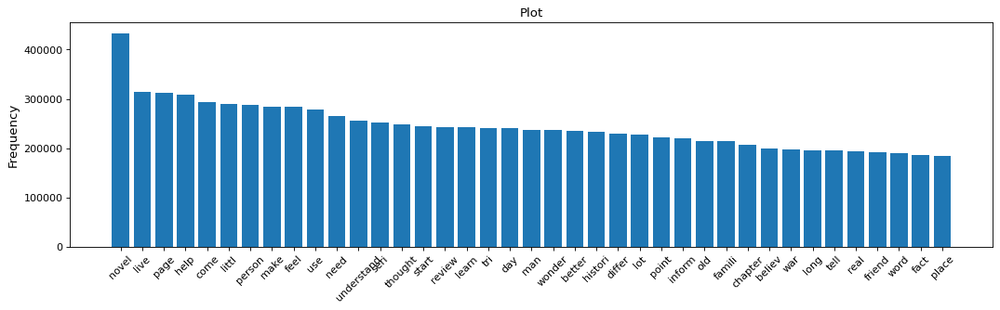

In [ ]:
plot_freq(40, analysis_stemming_reduced.word_frequencies_descending)

# 3 Clustering Analysis

In this part of the notebook I will use the clustering techniques to find the possible topics/frequent subjects.

In [8]:
from sklearn.feature_extraction.text import TfidfVectorizer, CountVectorizer
from sklearn.random_projection import SparseRandomProjection as srp
from sklearn.model_selection import train_test_split
from sklearn.decomposition import TruncatedSVD, PCA
from sklearn.cluster import KMeans, MiniBatchKMeans
from sklearn.preprocessing import Normalizer
from sklearn.pipeline import make_pipeline
from sklearn import metrics

In [9]:
# Function to load the vectorizer and the sparse matrix at once
def load_object_and_sparse_matrix(path_object: str, path_matrix: str):
    with open(path_object, 'rb') as f:
        obj = pickle.load(f)

    matrix = scipy.sparse.load_npz(path_matrix)

    return obj, matrix

#### Lemmatize Vocabulary Initialization

In [13]:
df_text_lemmatization = pd.read_csv("./datasets/cleaned_without_nan_lemmatization.csv", sep = ',')['review/text']

In [14]:
df_text_lemmatization.shape

(2062570,)

In [10]:
words_to_remove = ["want", "going", "point", "page", "plot", "lot", "novel", "world", "reader", "end", "little", "better", "best", "come", "thought", "easy", "half", "jordan", "bit", "series", "long", "piece", "list", "non", "yes", "tool", "name", "anti", "met", "worse",]

In [15]:
vectorizer = TfidfVectorizer(lowercase=False, min_df=150, max_df=263_000, stop_words=words_to_remove) 

In [16]:
X_tfidf = vectorizer.fit_transform(df_text_lemmatization)

In [ ]:
X_tfidf.shape

(2062570, 27268)

    with open('./datasets/vectorizer_lemmatization_reduced_new.pkl', 'wb') as f:
        pickle.dump(vectorizer, f)

    scipy.sparse.save_npz('./datasets/tfidf_lemmatization_reduced_new.npz', X_tfidf)

In [10]:
path_vectorizer = "./datasets/vectorizer_lemmatization_reduced_new.pkl"
path_tfidf = "./datasets/tfidf_lemmatization_reduced_new.npz"

In [11]:
vectorizer, X_tfidf = load_object_and_sparse_matrix(path_vectorizer, path_tfidf)

#### Stemming Vocabulary Initialization

In [ ]:
df_text_stemming = pd.read_csv("./datasets/cleaned_without_nan_stemming.csv", sep = ',')['review/text']

In [ ]:
df_text_stemming.shape

(2062568,)

In [ ]:
vectorizer = TfidfVectorizer(lowercase=False, min_df=150, max_df=240_000) 

In [ ]:
X_tfidf = vectorizer.fit_transform(df_text_stemming)

In [ ]:
with open('./datasets/vectorizer_stemming_reduced_new.pkl', 'wb') as f:
    pickle.dump(vectorizer, f)

In [ ]:
scipy.sparse.save_npz('./datasets/tfidf_stemming_reduced_new.npz', X_tfidf)

In [ ]:
path_vectorizer = "./datasets/vectorizer_stemming_reduced_new.pkl"
path_tfidf = "./datasets/tfidf_stemming_reduced_new.npz"

In [ ]:
vectorizer, X_tfidf =  load_object_and_sparse_matrix(path_vectorizer, path_tfidf)

### Kmeans

In this part of the notebook, I will use Kmeans directly on the text embeddings without further dimensionality reduction. 

I used `MiniBatchKMeans` as Kmeans algorithm, since faster than the classical one and also pretty accurate. I did some attempts with the classical Kmeans and the results were approximately equal with the mini batch version.  

Some of the functions I used are taken from the practicals we did in class, but most of them are re-implementions.

In [12]:
def make_word_cloud(frequencies: Dict[str, int]):
    wc = WordCloud(background_color="white", max_words=50)
    # Generate word cloud
    wc.generate_from_frequencies(frequencies)
    return wc

In [13]:
class KMeans_Clustering:
    def __init__(self, vectorizer: TfidfVectorizer, X_tfidf, km=None):
        self.vectorizer = vectorizer
        self.X_tfidf = X_tfidf

        # Terms in vocabulary
        self.terms = self.vectorizer.get_feature_names_out()

        if km is not None:
            self.km = km
            self.n_clusters = self.km.cluster_centers_.shape[0]
            self.centroids = self.km.cluster_centers_
            # Indices of largest centroids' entries in descending order
            self.sorted_centroids = self.centroids.argsort()[:, ::-1]

    
    def do_clustering(self, n_clusters: int, random_state: int=SEED):
        self.n_clusters = n_clusters

        start_time = time.time()
        self.km = MiniBatchKMeans(n_clusters=n_clusters, init='k-means++', max_iter=100, random_state=random_state)
        self.km.fit(self.X_tfidf) 
        end_time = time.time()
        print(f"Clustering computed in {end_time - start_time:.3f}s")

        self.centroids = self.km.cluster_centers_
        self.sorted_centroids = self.centroids.argsort()[:, ::-1]


    def print_relevant_terms_cluster(self):
        for c in range(self.n_clusters):
            print(f"Cluster {c}:", end='')

            for idx in self.sorted_centroids[c, :10]:
                print(f' {self.terms[idx]}', end='')
            print()


    def cluster_frequencies(self, idx_cluster: int):
        if idx_cluster > self.n_clusters:
            return

        term_frequencies = self.centroids[idx_cluster]        
        sorted_terms = self.sorted_centroids[idx_cluster]

        frequencies = {self.terms[i]: term_frequencies[i] for i in sorted_terms}
        return frequencies

    def plot_word_cloud(self):
        wcs = []
        for c in range(self.n_clusters):
            freq = self.cluster_frequencies(c)
            wcs.append(make_word_cloud(freq))
        
        # Plot 4 word cloud per row
        fig = plt.figure(figsize=(25, 12))
        for i in range(self.n_clusters):
            ax = fig.add_subplot(math.ceil(self.n_clusters/4) , 4, i+1)
            ax.imshow(wcs[i])
            ax.axis('off')

        plt.show()


    """
    When SVD or Random Projections are applied before the clustering,
    it is needed to transform back the centroids in the original space.
    In that case, you can use 'set_centroids' to re-set the centroids
    and obtaining the expected plots.
    """
    def set_centroids(self, new_centroids):
        self.centroids = new_centroids
        self.sorted_centroids = self.centroids.argsort()[:, ::-1]

Since the number of clusters is not known a priori, I tried several values and then computed the inertia of each result. **Inertia** is the sum of squared distance of each point to its closest centroid, i.e., its assigned cluster. Therefore, I am looking for a model with low inertia and a low number of clusters. However, this is not really feasible in practice, since as k increases, inertia decreases.

An approch to "solve" the trade-off is to apply the *Elbow method* to find the point where the inertia decreases slowly. 

In [14]:
def try_different_kmeans(X, max_num_clusters):
    clusters_inertia = [] 
    kms = []
    start_time = time.time()
    for k in range(1, max_num_clusters):
        km = MiniBatchKMeans(n_clusters=k, init='k-means++', max_iter=100, random_state=SEED)
        km.fit(X) 
        kms.append(km)
        clusters_inertia.append(km.inertia_)
    end_time = time.time()
    print(f"Done in {end_time - start_time:.3f}s")
    return kms, clusters_inertia

In [15]:
def plot_kmeans_inertia(clusters_inertia: List[float]):
    figure(figsize=(10, 4), dpi=80)

    plt.plot(np.arange(1, len(clusters_inertia)+1), clusters_inertia, marker="o") 

    plt.xticks(np.arange(1, len(clusters_inertia)+1, 1.0))
    plt.ylabel('Inertia', fontsize=12)
    plt.xlabel('Number of Clusters', fontsize=12)
    plt.grid()
    plt.show()

#### Lemmatization

In [ ]:
km_lemmatization = KMeans_Clustering(vectorizer, X_tfidf)

Let us see what happens with 18 clusters...

In [ ]:
km_lemmatization.do_clustering(18)

/usr/local/lib/python3.8/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 3 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Clustering computed in 44.329s


In [ ]:
km_lemmatization.print_relevant_terms_cluster()

Cluster 0: romance vampire mystery heroine hero historical suspense enjoyed loved favorite
Cluster 1: history man american family writing new human fiction place writer
Cluster 2: ending enjoyed happy liked felt interesting movie left loved surprise
Cluster 3: bible study god scripture christian word translation version biblical jesus
Cluster 4: loved recommend movie wonderful wait friend absolutely favorite old got
Cluster 5: bought edition copy guide kindle version amazon buy exam new
Cluster 6: dog training owner breed puppy animal pet lover old recommend
Cluster 7: looking forward look recommend new enjoyed information writing help highly
Cluster 8: child parent adult young family old wonderful mother illustration age
Cluster 9: recommend enjoyed movie excellent got new day favorite fan highly
Cluster 10: recipe information cookbook food wonderful cooking cook ingredient use useful
Cluster 11: woman men man young husband relationship girl mother family friend
Cluster 12: war civil 

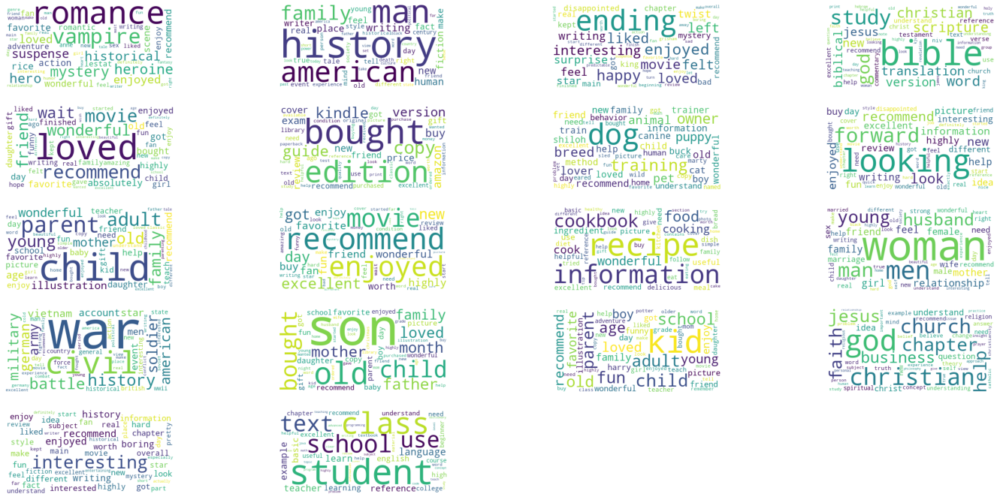

In [ ]:
km_lemmatization.plot_word_cloud()

As first attempt, without investigating the inertia score, we obtain some pretty good clusters, even though there are two clusters about religion and some clusters that are simply a mixture of adjectives and adverbs (intersting, recommended, enjoyed, loved, etc.). 

The most evident clusters/topics are about: `religion` (bible, god, jesus), `war` (history, battle, military), `school` (class, student, learn), `cooking` (recipe, cookbook, food), `animals` (dog, cat, puppy), `family` (son, child, father, mother).

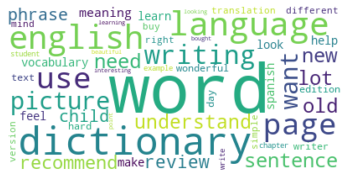

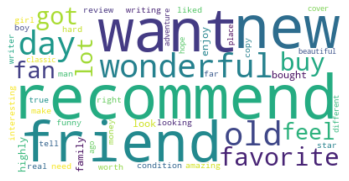

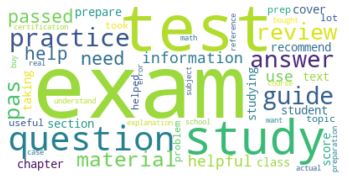

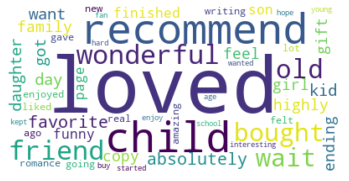

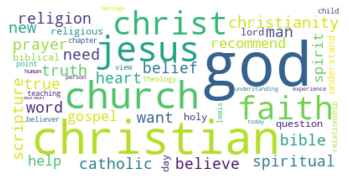

...

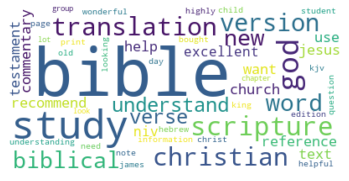

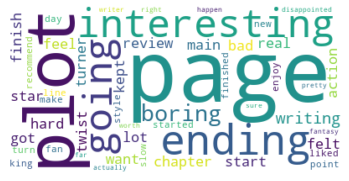

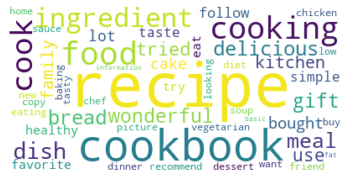

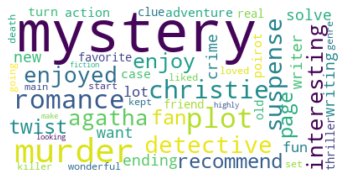

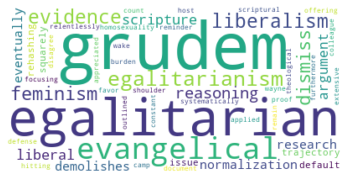

In [ ]:
# centroids = km.cluster_centers_.argsort()[:, ::-1]
# for i in range(km.cluster_centers_.shape[0]):
#     freq = cluster_frequencies(km, i, centroids, vectorizer)
#     make_word_cloud(freq)
#     print()

In one of the first attempts I did, I found the above cloud of words. Unfortunately, it was at the beginning and I did not save the configuration, but I wanted to keep it even though it is not plotted in horizontal as the other ones. 

I kept it since I found three interesting clusters that I could not get in a easy way with other methods.
- The first one (the third image) is about `exam preparation`, as we have words like test, exam, practice, study, guide, material, answer etc.
- Then, excluding the two words 'lyricism' and 'distills', there are terms about `hurricanes`, such as atmosphere, katrina (for the Katrina Hurricane), surviving, disaster, etc.
- Another peculiar one is the last image that is about `political phylosophy`, since we have school of thought like 'egalitarianism', 'liberalism', 'feminism' and 'grudem', that is the name of the professor Wayne Grudem, who has written about theology.  

In [16]:
kms_lemmatization, clusters_inertia_lemmatization = try_different_kmeans(X_tfidf, 26)

Done in 1103.965s


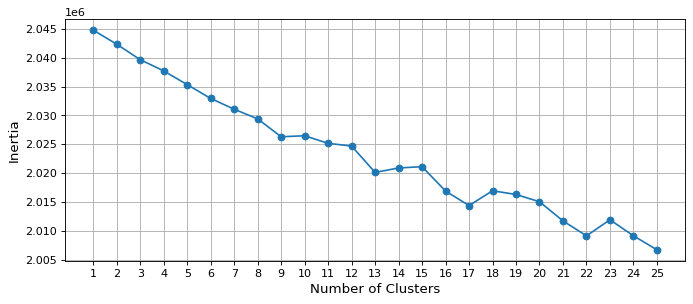

In [17]:
plot_kmeans_inertia(clusters_inertia_lemmatization)

The above graph shows the inertia of Kmeans when different number of clusters are chosen. Since the algorithm is the mini batch version of the algorithm we have some 'noise' due to the fact that it is not used the entire dataset at every iteration. Thus, we cannot be really confident in which *k* to select for what concerns the *Elbow*; moreover, in this case there is not an clear elbow. Nevertheless, I attemped some values and it seemed that with 17 clusters (`idx_cluster=16`) we obtain decent results. Of course there are some clusters with many stop words, like 'arrived', quickly', 'seller', 'recommended', but as I said in the pre-processing phase, although they did not add information about a specific topic, they express the fact that many reviews talk about the users' experience concerning the purchase or about what they liked of the books.

In [32]:
idx_cluster = 16
km_lemmatization = KMeans_Clustering(vectorizer, X_tfidf, kms_lemmatization[idx_cluster])

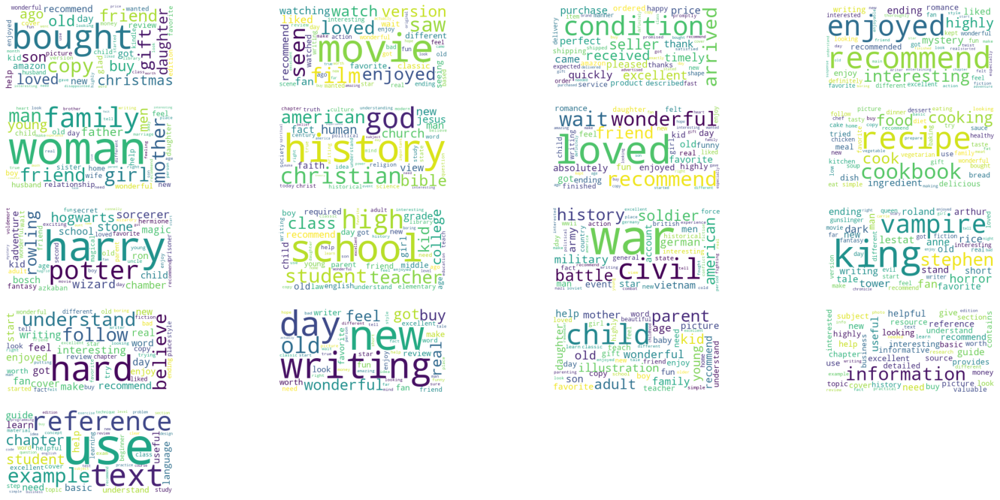

In [33]:
km_lemmatization.plot_word_cloud()

    with open('./datasets/kms_1-25_lemmatization_reduced_new.pkl', 'wb') as f:
        pickle.dump(kms_lemmatization, f)

#### Stemming

Since I replicated the work also for the stemmed vocabulary, I will comment less this part, unless there are some interesting aspects to point out.

In [ ]:
km_stemming = KMeans_Clustering(vectorizer, X_tfidf)

From the intuition of Lemmatization, I can start to look at what happens if I choose 18 clusters. Then I will analyse the inertia trend to pick more carefully.

In [ ]:
km_stemming.do_clustering(18)

Clustering computed in 56.228s


In [ ]:
km_stemming.print_relevant_terms_cluster()

Cluster 0: landscap mental westward devolv norwegian shockingli steadili midwest catalogu refreshingli
Cluster 1: novel plot wonder feel live littl come thought man famili
Cluster 2: help use understand god need person christian chapter studi point
Cluster 3: histori war american histor civil event polit novel battl fact
Cluster 4: women men woman live man need relationship famili feel husband
Cluster 5: movi page buy bought got condit copi thank old order
Cluster 6: inform use help lot need guid easi provid refer cover
Cluster 7: easi lot understand help use follow fun make littl need
Cluster 8: seri wait start plot novel jordan fantasi better fan finish
Cluster 9: incred novel amaz page feel wonder live beauti make thought
Cluster 10: children child parent kid adult illustr young famili old wonder
Cluster 11: step help instruct easi guid use need learn understand process
Cluster 12: excel condit highli job help understand easi use refer arriv
Cluster 13: recip cookbook cook food ingr

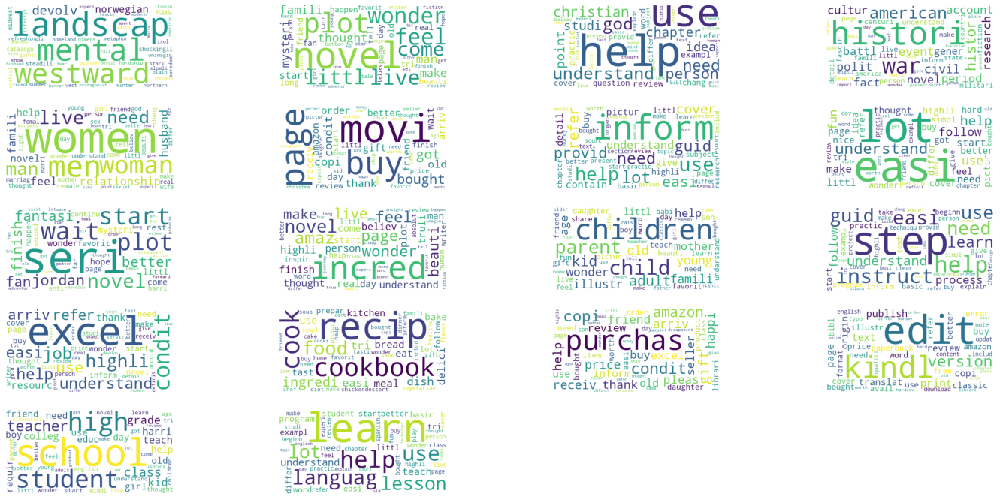

In [ ]:
km_stemming.plot_word_cloud()

As we can see from the previous plot, we obtained pretty good results with 18 clusters. In this case I did not remove stop words from the vectorizer, hence we get some of them (seri, page, buy, steo, lot, etc.). 

However, we can see and interesting cluster in the top left corner that talks about `weather and seasons` (landscape, westward, norwegian, snow, summer, northern, etc.).

Another interesting ones are the ones that talk about `cooking`, `school` and `history/war`. 

In [ ]:
kms_stemming, clusters_inertia_stemming = try_different_kmeans(X_tfidf, 26)

Done in 827.070s


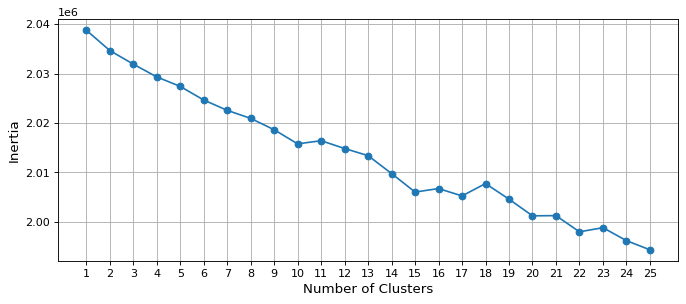

In [ ]:
plot_kmeans_inertia(clusters_inertia_stemming)

In [ ]:
km = KMeans_Clustering(vectorizer, X_tfidf, kms_stemming[14])

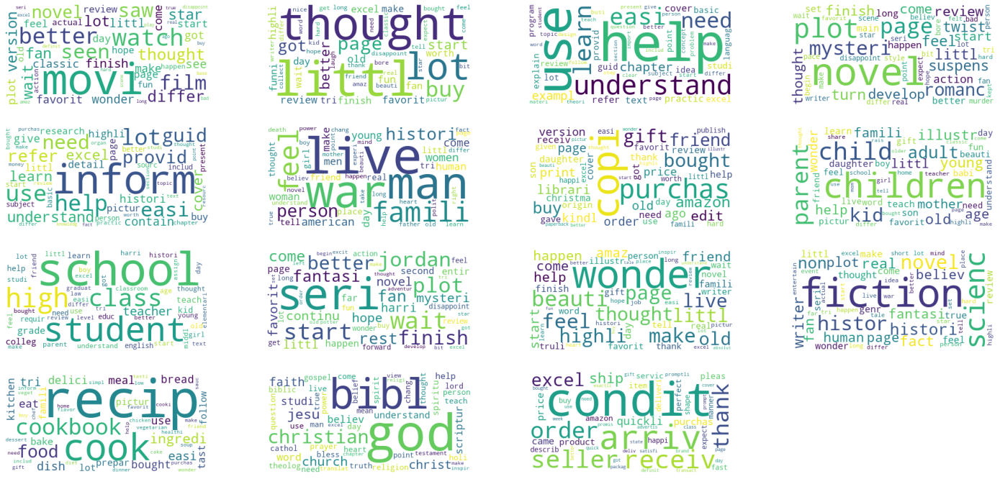

In [ ]:
km.plot_word_cloud()

In [ ]:
km = KMeans_Clustering(vectorizer, X_tfidf, kms_stemming[19])

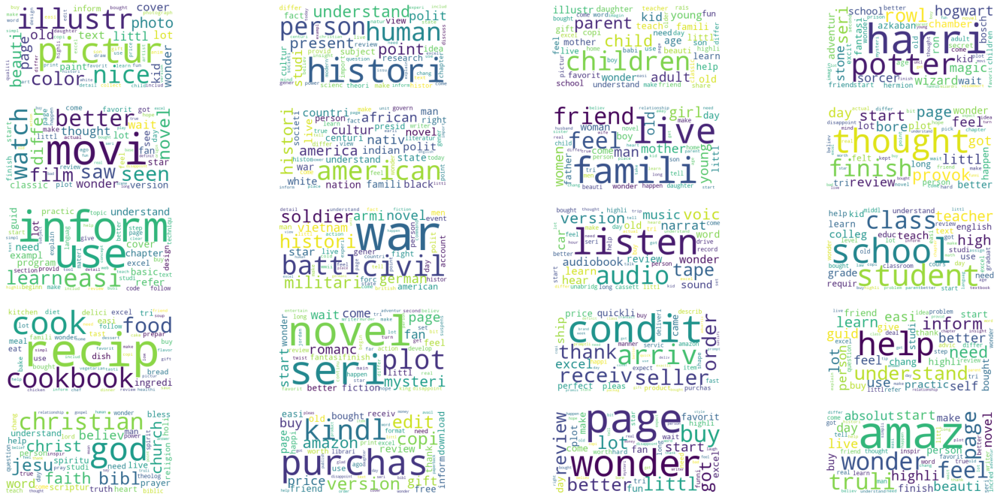

In [ ]:
km.plot_word_cloud()

Here, I noticed two different topics that I did not found with lemmatization. The one in the top left corner that is about `pictures` (illustr, pictur, color, photo) and one in the center part about `music` (listen, audio, tape, audiobook).

### SVD

In **S**ingular **V**alue **D**ecomposition (SVD) analysis, we keep the first *k* components (singular vectors) of the decomposition. Thus, we are projecting each TF-IDF vector into a subspace represented by the first *k* right singular vectors, so the 'concept/topic space'.

In this part, I tried to simply use the first components of SVD to see which clusters/topics I can get. In particular, I am looking for the minimum number of singular values that preserve a good **energy** of the original matrix.

In [35]:
class SVD_Decomposition:
    def __init__(self, vectorizer, X_tfidf, svd=None):
        self.vectorizer = vectorizer
        self.X_tfidf = X_tfidf

        # Terms in vocabulary
        self.terms = self.vectorizer.get_feature_names_out()

        self.normalizer = Normalizer(copy=False)

        if svd is not None:
            self.svd = svd
            self.n_components = svd.components_.shape[0]
            self.lsa = make_pipeline(self.svd, self.normalizer)

    def do_svd(self, n_components):
        self.n_components = n_components

        start_time = time.time()
        self.svd = TruncatedSVD(n_components=n_components, n_iter=7, random_state=SEED)
        self.lsa = make_pipeline(self.svd, self.normalizer)
        self.X_lsa = self.lsa.fit_transform(X_tfidf)
        end_time = time.time()
        print(f"SVD Decomposition computed in {end_time - start_time:.3f}s")


    def print_relevant_terms(self):
        for i in range(self.n_components):
            terms_comp = [[self.terms[j], self.svd.components_[i][j]] for j in range(self.svd.components_.shape[1])]
            asc_terms = sorted(terms_comp, key= lambda x:x[1], reverse=True)[:10]
            des_terms = sorted(terms_comp, key= lambda x:x[1], reverse=False)[:10]
            print(f"Topic {i}: ")
            s = []
            for t in asc_terms:
                s.append(t[0])
            print("Ascending order:", " ".join(s))
            s = []
            for t in des_terms:
                s.append(t[0])
            print("Descending order:", " ".join(s))

    def svd_frequencies(self, k, reverse):
        if k > self.n_components:
            return

        if reverse == False:
            frequencies = {self.terms[j]: self.svd.components_[k][j] for j in range(self.svd.components_.shape[1])}
        else:
            frequencies = {self.terms[j]: -self.svd.components_[k][j] for j in range(self.svd.components_.shape[1])}    
        return frequencies


    def make_word_cloud(self, frequencies: Dict[str, int]):
        wc = WordCloud(background_color="white", max_words=50)
        # Generate word cloud
        wc.generate_from_frequencies(frequencies)

        # Show
        plt.imshow(wc, interpolation="bilinear")
        plt.axis("off")
        plt.show()

    def plot_word_cloud(self):
        for k in range(self.n_components):
            freq = self.svd_frequencies(k, reverse=True)
            self.make_word_cloud(freq)
            freq = self.svd_frequencies(k, reverse=False)
            self.make_word_cloud(freq)
            print()

In [36]:
def try_different_svds(X, max_num_components):
    normalizer = Normalizer(copy=False)

    explained_variances = [] 
    svds = []

    start_time = time.time()
    for k in range(1, max_num_components):
        svd = TruncatedSVD(n_components=k, n_iter=7, random_state=SEED)
        lsa = make_pipeline(svd, normalizer)
        lsa.fit(X)
        svds.append(lsa)
        explained_variances.append(svd.explained_variance_ratio_.sum())

    end_time = time.time()
    print(f"Done in {end_time - start_time:.3f}s")
    return svds, explained_variances
    

In [37]:
def plot_svds_explained_variance(explained_variances: List[float]):
    figure(figsize=(10, 4), dpi=80)

    plt.plot(np.arange(1, len(explained_variances)+1), explained_variances, marker="o") 

    plt.xticks(np.arange(1, len(explained_variances)+1, 1.0))
    plt.ylabel('Explained Variance Sum', fontsize=12)
    plt.xlabel('Number of Components', fontsize=12)
    plt.grid()
    plt.show()

#### Lemmatization

In [82]:
k = 25
svd = TruncatedSVD(n_components=k, n_iter=7, random_state=SEED)
normalizer = Normalizer(copy=False)
lsa = make_pipeline(svd, normalizer)

In [ ]:
X_lsa = lsa.fit_transform(X_tfidf)

In [83]:
svd_decomposition_lemmatization = SVD_Decomposition(vectorizer, X_tfidf)

In [84]:
svd_decomposition_lemmatization.do_svd(25)

SVD Decomposition computed in 123.847s


In [86]:
svd_decomposition_lemmatization.svd.explained_variance_ratio_.sum()

0.03578423823248206

In [ ]:
svds_lemmatization, explained_variances_lemmatization = try_different_svds(X_lsa, 26)

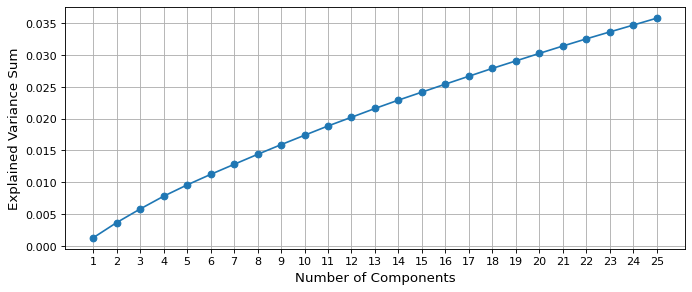

In [ ]:
plot_svds_explained_variance(explained_variances_lemmatization)

As expected from this type of dataset, the explained variance preserved by the first components is very little. Indeed, the trend seems to be almost linear for the first 25 components (values between 0.0 and 0.035).

In [88]:
def plot_explained_variance_trend(svd):
    values = svd.explained_variance_ratio_
    values_sorted = sorted(values, reverse=True) # The values are not sorted

    figure(figsize=(0.5 * len(values), 4), dpi=80)
    plt.plot(np.arange(1, len(values_sorted)+1), values_sorted)
    plt.xticks(np.arange(1, len(values_sorted)+1, 1.0))
    plt.grid()
    plt.show()

The following plot represents the explained variance ratio trend for 25 components in Truncated SVD. Also, here the goal is to find a good approximation by looking at the *Elbow*. 

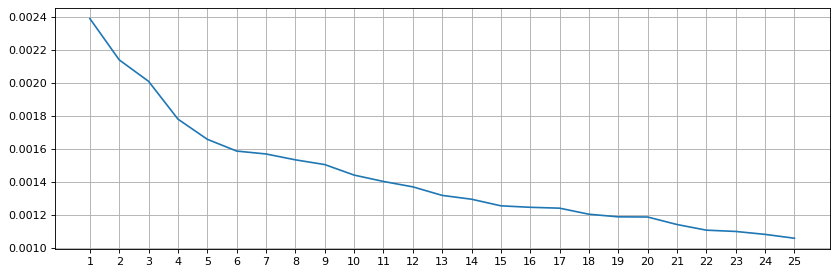

In [89]:
plot_explained_variance_trend(svd_decomposition_lemmatization.svd)

In the analysis I considered the terms in both ascending and descending order, as done in one of the pratical classes. In this way, we are in some sense expressing the (negative) correlation between topics, since it is like we are considering the singular vectors **u_i** and **v_i** in the two cases when they are both positive and negative (the product in this case must be positive as we are dealing with term frequencies).  

In [90]:
svd_decomposition_lemmatization.print_relevant_terms()

Topic 0: 
Ascending order: child recommend new interesting writing woman day old history family
Descending order: cuenta creo decir escrito parece leido mejores cual cualquier tambin
Topic 1: 
Ascending order: child loved kid old enjoyed wonderful favorite family friend movie
Descending order: information history chapter text use example reference study excellent guide
Topic 2: 
Ascending order: child information recommend recipe bought excellent use condition highly copy
Descending order: war woman movie man interesting history ending mystery fiction writing
Topic 3: 
Ascending order: child god woman parent family young man christian mother war
Descending order: recommend loved movie enjoyed highly condition got recipe bought excellent
Topic 4: 
Ascending order: recommend highly enjoyed history god recommended child interesting interested excellent
Descending order: recipe buy condition bought got copy new review movie edition
Topic 5: 
Ascending order: god loved woman bible condition

In [91]:
svd_decomposition_lemmatization.plot_word_cloud()

Output hidden; open in https://colab.research.google.com to view.

In this case, the clusters are not so clean, thus we have words of different topics in the same plot. The reason may be the fact that we retain really little *energy* with the first components, indeed the sum of the explained variance ratio of the first 25 components is only 0.036

#### Stemming

In [ ]:
k = 50
svd = TruncatedSVD(n_components=k, n_iter=7, random_state=SEED)
normalizer = Normalizer(copy=False)
lsa = make_pipeline(svd, normalizer)

In [ ]:
X_lsa = lsa.fit_transform(X_tfidf)

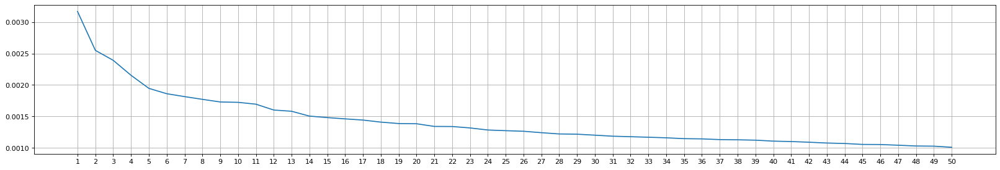

In [ ]:
plot_explained_variance_trend(svd)

In [ ]:
svd_decomposition_stemming = SVD_Decomposition(vectorizer, X_tfidf)

In [ ]:
svd_decomposition_stemming.do_svd(14)

In [ ]:
svd_decomposition_stemming.plot_word_cloud()

Output hidden; open in https://colab.research.google.com to view.

The results did not impove much with respect the lemmatization case.

### SVD before Kmeans

#### Lemmatization

In [38]:
svd_before_km_lemmatization = SVD_Decomposition(vectorizer, X_tfidf)

In order to preserve more information I will use the first 100 components.

In [39]:
svd_before_km_lemmatization.do_svd(100)

SVD Decomposition computed in 430.935s


In [51]:
svd_before_km_lemmatization.svd.explained_variance_ratio_.sum()

0.09777356745951113

In [40]:
svd_kms_lemmatization, svd_clusters_inertia_lemmatization = try_different_kmeans(svd_before_km_lemmatization.X_lsa, 26)

Done in 140.692s


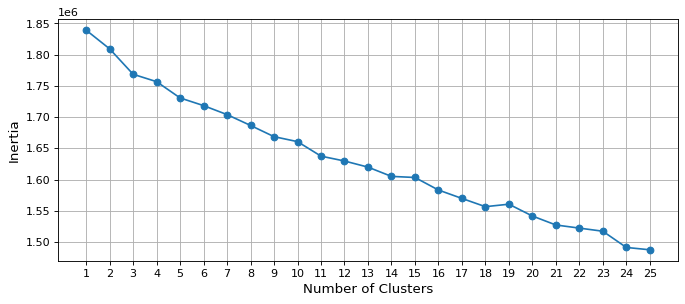

In [41]:
plot_kmeans_inertia(svd_clusters_inertia_lemmatization)

In [56]:
idx_cluster = 15
svd_km_lemmatization = KMeans_Clustering(vectorizer, svd_before_km_lemmatization.X_lsa, svd_kms_lemmatization[idx_cluster])

When we apply dimentionality reduction before Kmeans, we need to get back the centroids to the original space.

In [57]:
svd_original_space_centroids = svd_before_km_lemmatization.svd.inverse_transform(svd_km_lemmatization.km.cluster_centers_)

In [58]:
svd_km_lemmatization.set_centroids(svd_original_space_centroids)

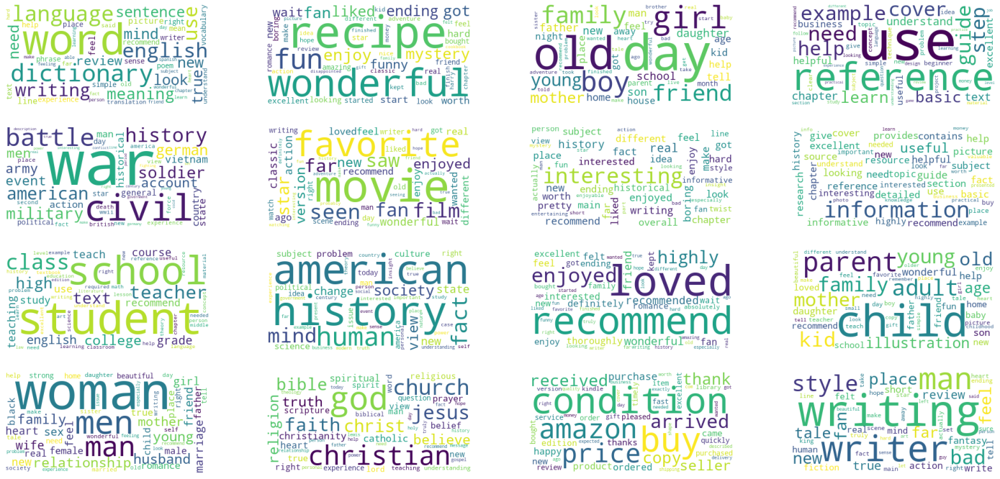

In [59]:
svd_km_lemmatization.plot_word_cloud()

When we apply SVD before Kmeans we still preserve a pretty good quality of the clusters. Indeed, they are similar to the ones obtained by only applying Kmeans. The advantage of first using SVD is the computational time, as it takes approximately 570s to compute both the decomposition and the various Kmeans with different clusters VS about 850-1100s of the direct approach.

#### Stemming

In [ ]:
svd_before_km_stemming = SVD_Decomposition(vectorizer, X_tfidf)

In [ ]:
svd_before_km_stemming.do_svd(100)

SVD Decomposition computed in 327.548s


In [ ]:
svd_kms_stemming, svd_clusters_inertia_stemming = try_different_kmeans(svd_before_km_stemming.X_lsa, 26)

Done in 149.192s


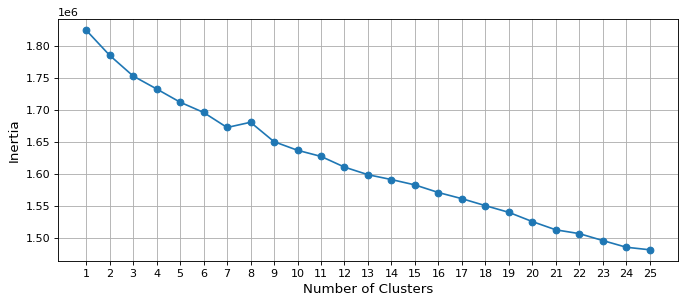

In [ ]:
plot_kmeans_inertia(svd_clusters_inertia_stemming)

In [ ]:
idx_cluster = 12
svd_km_stemming = KMeans_Clustering(vectorizer, svd_before_km_stemming.X_lsa, svd_kms_stemming[idx_cluster])

When we apply dimentionality reduction before Kmeans, we need to get back the centroids to the original space.

In [ ]:
svd_original_space_centroids = svd_before_km_stemming.svd.inverse_transform(svd_km_stemming.km.cluster_centers_)

In [ ]:
svd_km_stemming.set_centroids(svd_original_space_centroids)

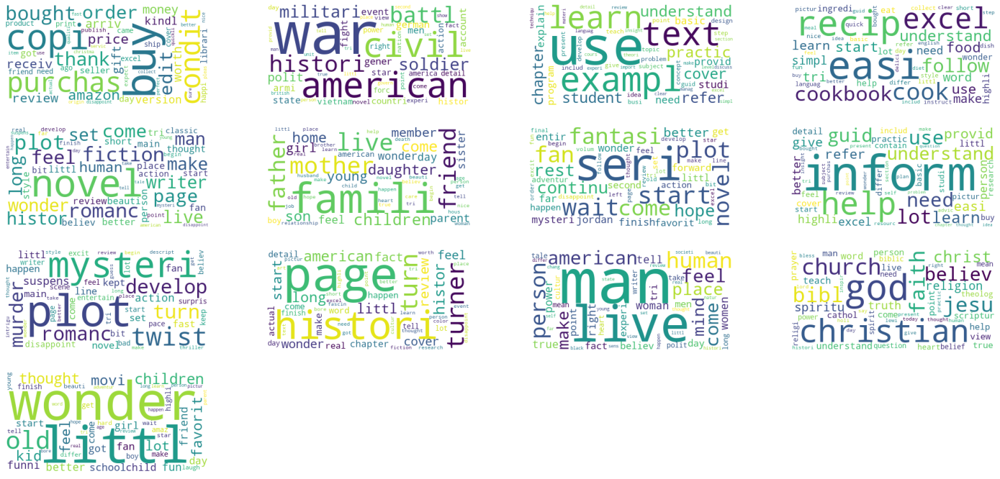

In [ ]:
svd_km_stemming.plot_word_cloud()

### Random Projections

In [60]:
def compute_centroids_original_space_proj(km_proj, X_original):
    original_space_centroids = np.zeros((km_proj.cluster_centers_.shape[0], X_original.shape[1])) # Initializing true_k centroid arrays

    # For each cluster
    for idx_cluster in range(original_space_centroids.shape[0]):
        # Take the sum of all the points in this cluster
        original_space_centroids[idx_cluster] = np.asarray(X_original[km_proj.labels_ == idx_cluster].sum(axis=0)).squeeze()

        cluster_size = (km_proj.labels_ == idx_cluster).sum()
        original_space_centroids[idx_cluster] = original_space_centroids[idx_cluster] / cluster_size # Normalize by cluster size

    return original_space_centroids

#### Lemmatization

In [61]:
transformer = srp(n_components=500, dense_output=False, random_state=SEED)

In [63]:
start_time = time.time()
X_proj = transformer.fit_transform(X_tfidf)
end_time = time.time()
print(f"Random Projections computed in {end_time - start_time:.3f}s")

Random Projections computed in 11.378s


In [64]:
proj_kms_lemmatization, proj_clusters_inertia_lemmatization = try_different_kmeans(X_proj, 26)

Done in 120.386s


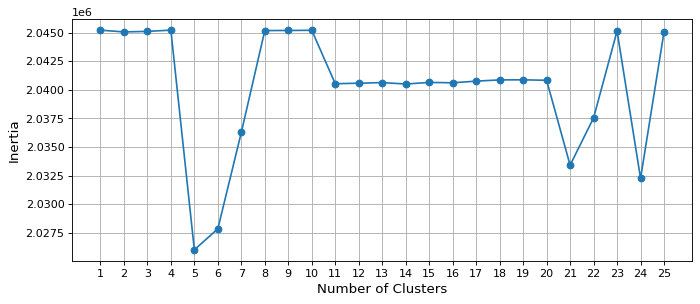

In [65]:
plot_kmeans_inertia(proj_clusters_inertia_lemmatization)

When we use Random Projections before Kmeans we obtain an 'unstable' trend of the Kmeans inertia. Therefore, it is not really possible to apply the *Elbow method*. So, in this case, I attempted some values and see what I can get. 

In [78]:
idx_cluster = 23
proj_before_km_lemmatization = KMeans_Clustering(vectorizer, X_proj, proj_kms_lemmatization[idx_cluster])

When we apply dimentionality reduction before Kmeans, we need to get back the centroids to the original space.

In [79]:
proj_original_space_centroids = compute_centroids_original_space_proj(proj_before_km_lemmatization.km, X_tfidf)

In [80]:
proj_before_km_lemmatization.set_centroids(proj_original_space_centroids)

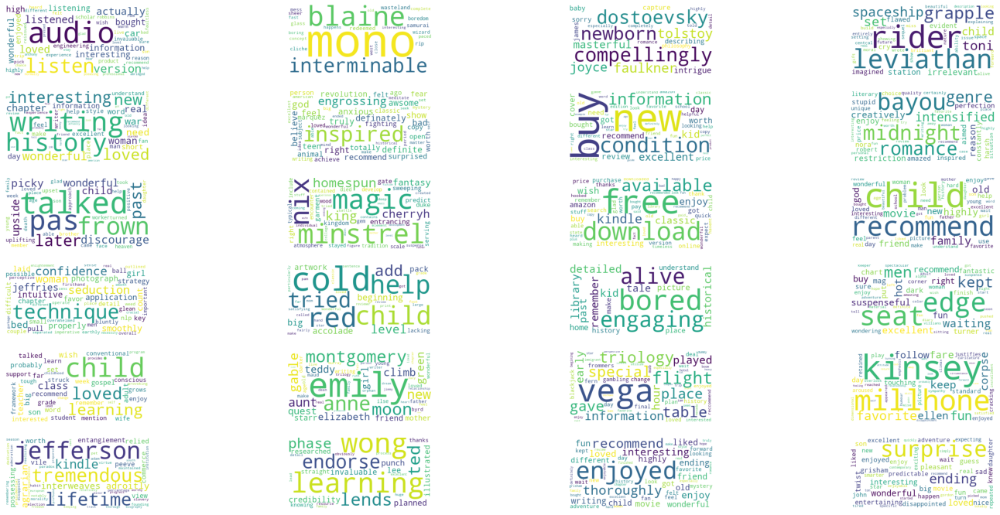

In [81]:
proj_before_km_lemmatization.plot_word_cloud()

#### Stemming

In [ ]:
transformer = srp(n_components=500, dense_output=False, random_state=SEED)

In [ ]:
start_time = time.time()
X_proj = transformer.fit_transform(X_tfidf)
end_time = time.time()
print(f"Random Projections computed in {end_time - start_time:.3f}s")

Random Projections computed in 10.056s


In [ ]:
proj_kms_stemming, proj_clusters_inertia_stemming = try_different_kmeans(X_proj, 26)

Done in 222.376s


In [ ]:
with open('./datasets/proj_kms_stemming.pkl', 'wb') as f:
    pickle.dump(proj_kms_stemming, f)

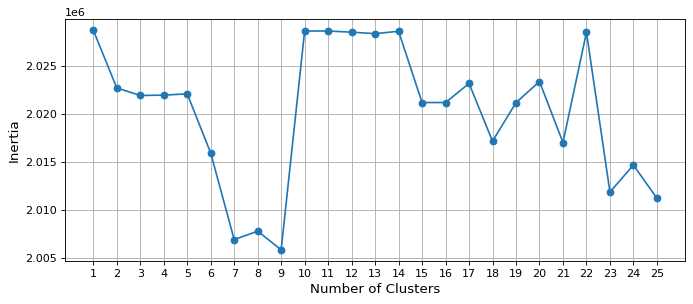

In [ ]:
plot_kmeans_inertia(proj_clusters_inertia_stemming)

In [ ]:
idx_cluster = 17
proj_before_km_stemming = KMeans_Clustering(vectorizer, X_proj, proj_kms_stemming[idx_cluster])

When we apply dimentionality reduction before Kmeans, we need to get back the centroids to the original space.

In [ ]:
proj_original_space_centroids = compute_centroids_original_space_proj(proj_before_km_stemming.km, X_tfidf)

In [ ]:
proj_before_km_stemming.set_centroids(proj_original_space_centroids)

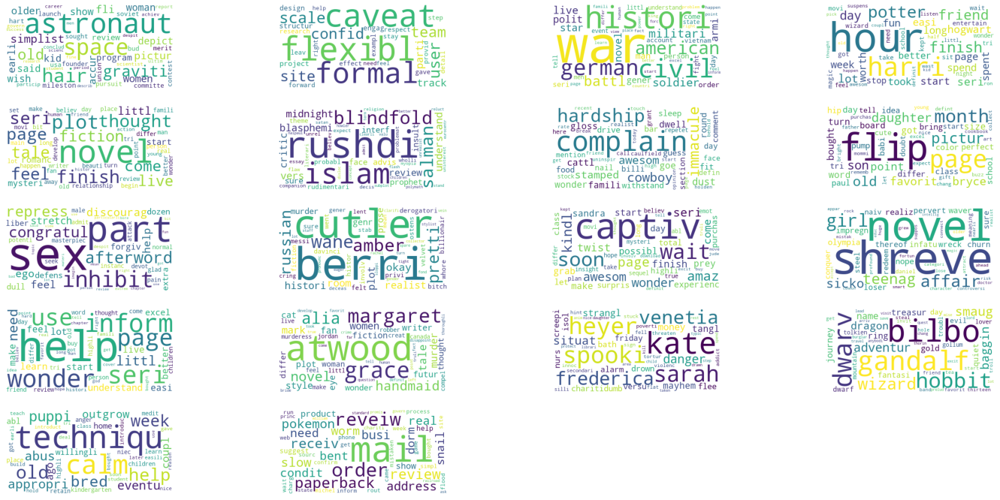

In [ ]:
proj_before_km_stemming.plot_word_cloud()

In this case, Random Projection has done a really good job in my opinion. Indeed, differently from the others methods, it has found peculiar clusters. In some sense, it shows clusters of specific topics or themes. 

For instance, the one in the left top corner talks about `space` (astronaut, space, graviti); another one in the center is about `criticism, journalism`, indeed there are words like Salman Rushdi (i.e., the writer Rushdie Salman) who, by browising the internet, has written a novel 'The Satanic Verses' which seems to be a critic toward the Islamic religion.

The one in the bottom left corner talks about `fantasy`, as it presents names from 'The Lord of the Rings'.

In the bottom center part there is the name of Margaret Atwood, who is poetess that writes `novels, tales`; also she supports feminism, indeed there are words like 'woman', 'handmaid', 'tale', 'novel', etc. There is also title of her novel called 'Alias Grace'.

# 4. Conclusions

In the end, I have found topics/genres such as `war`, `religion`, `school`, `exam preparation`, `history`, `family`, `cooking`, `movies`, `space`, `pictures`, `music`, `weather`, `hurricane`, `political phylosophy`, `journalism`, `sex`, `mistery genre`, `fantasy genre`.

These are the results from the various attempts I did, so unfortunately I could not get one single application of Kmeans with all of them.

Moreover, there are some clusters expressing users' opinions, experience, interest etc. about their purchases.

For what concerns the lemmatize and stemming analysis, I did not notice strong differences, even though in general *stemming* has found nicer clusters; by also considering that I did not removed particular words from the vocabulary, as happened with lemmatization. The pros of *lemmatization* about the vocabulary and the cloud of words is that most of the terms are english words, since they have not been truncated like in stemming. So, it is possible to recognize niche topics faster, specifically when they are about writers, artists, etc.


One of the best approaches in terms of quality of the clusters and execution time is applying SVD before Kmeans. The trickier part was to figure out which should be *k* for the initial decomposition. Perhaps, the cons with this approach is that it founds pretty 'standard' clusters (war, religion, school, etc.) and nothing really in depth. The reason could be that the 'standard' clusters are composed by frequent and important words, that in some sense preserve most of the variance (and energy) of the original space; therefore, if I investigated more with other values of *k*, maybe I would find something more revealing.

Surprisingly, thanks to Random Projections I discovered some peculiar clusters and I would say niche topics, that I could not find with the other approaches. In this case, I could not really explain why, but it seemed that randomness helped a bit.